###**Dataset used: Street sign dataset**

# Object Detection using YOLOv11 on Google Colab

Here are the main points from the text:

1.  A faster, single-shot object detection algorithm without losing accuracy.  
2.  Object detection as a regression problem, using a single forward pass through a Fully Neural Network (FNN).  
3. YOLO divides the image into a grid and predicts bounding boxes and class probabilities for each grid cell in one shot.  
4. Unlike two-stage detectors (e.g., Faster R-CNN), YOLO’s single-shot approach significantly boosts speed and efficiency..

**Milestones in YOLO Evolution (V1 to V11)**


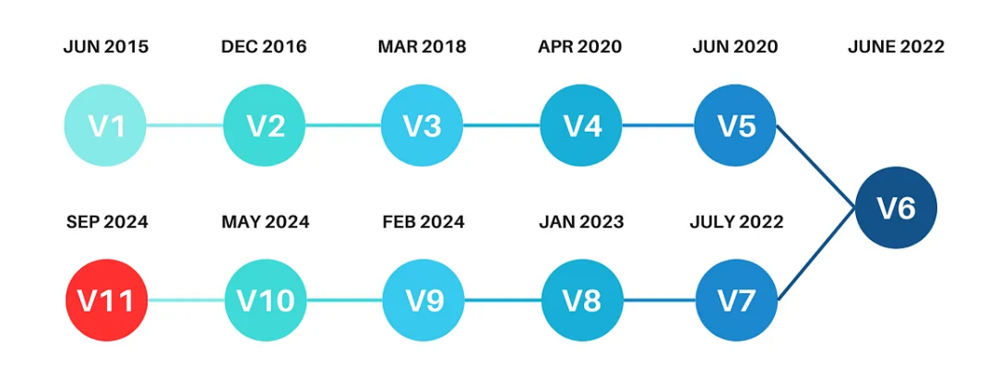

| **Version**   | **Year** | **Key Features**                                                                                                                                          | **Improvements**                                                                                   |
|---------------|----------|------------------------------------------------------------------------------------------------------------------------------------------------------------|-----------------------------------------------------------------------------------------------------|
| **YOLOv1**     | 2016     | Single-shot detection using a coarse grid                                                                                                                  | Real-time speed; struggled with small object detection                                              |
| **YOLOv2**     | 2017     | Batch normalization, anchor boxes, higher resolution input                                                                                                 | Better accuracy and localization                                                                   |
| **YOLOv3**     | 2018     | Multi-scale predictions via feature pyramids                                                                                                               | Improved detection of objects at various scales                                                    |
| **YOLOv4**     | 2020     | Mosaic augmentation, self-adversarial training, optimized backbone networks                                                                                | Enhanced training robustness and inference speed                                                   |
| **YOLOv5**     | 2020     | PyTorch implementation, no official paper                                                                                                                  | Widely adopted due to ease of use and deployment efficiency                                        |
| **YOLOv6 & v7**| 2022     | Model scaling, efficient lightweight versions (e.g., YOLOv7 Tiny)                                                                                           | High performance on edge devices                                                                   |
| **YOLOv8**     | –        | CSPDarkNet backbone, path aggregation                                                                                                                      | Improved speed and accuracy                                                                       |
| **YOLOv11**    | 2024     | C3K2 blocks, SPFF (Spatial Pyramid Pooling Fast), C2PSA attention mechanisms                                                                               | Enhanced small object detection, better accuracy, real-time inference maintained                   |


**YOLOv11 Architecture**

- YOLOv11’s main innovations are the C3K2 block, SPFF module, and C2PSA block
- Improve spatial information processing while preserving high-speed inference.

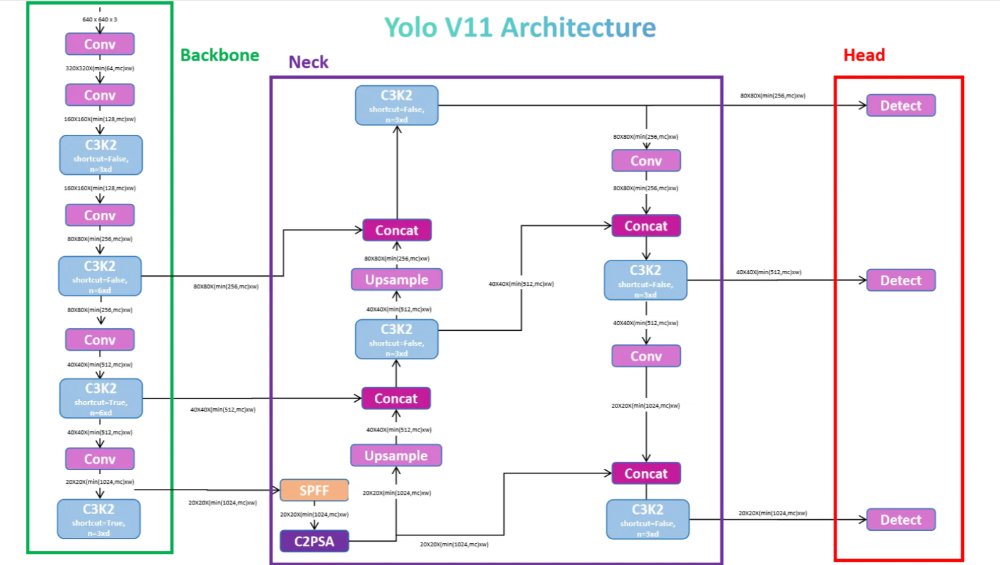

**Detailed Explanation of the YOLOv11 Architecture**
1. Backbone
- Convolutional Block
- Bottle Neck
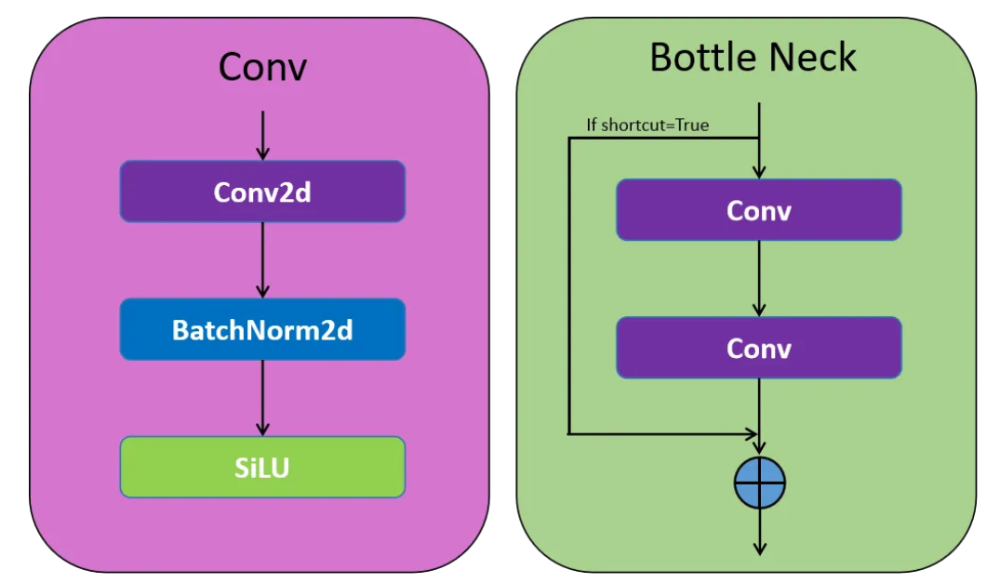



- C3K2

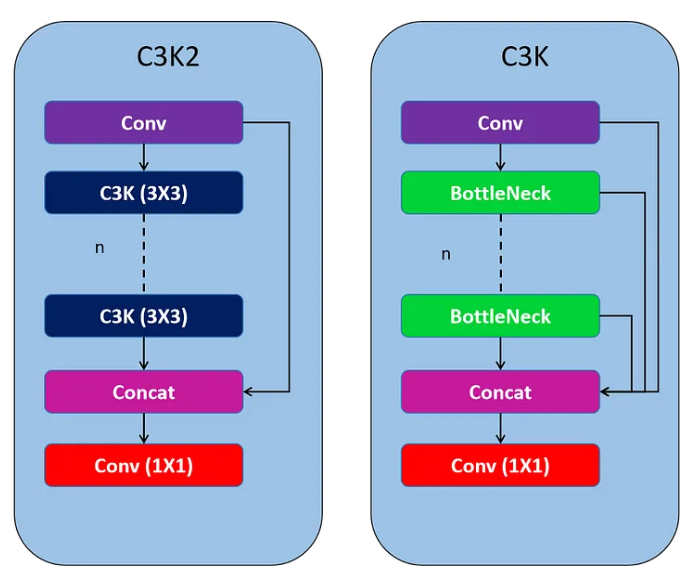

2. Neck
- Spatial Pyramid Pooling Fast (SPFF) and Upsampling

 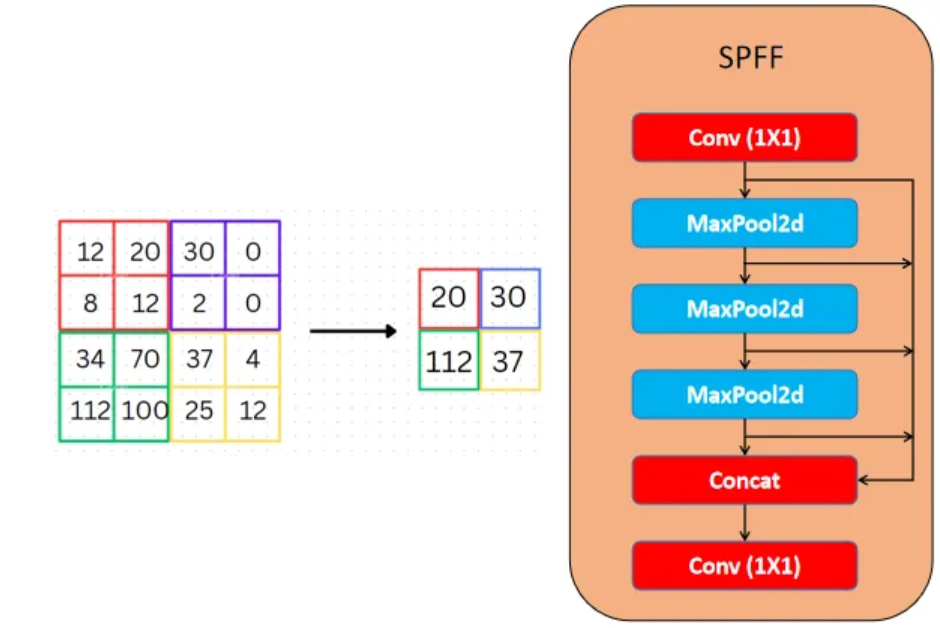

 3. Attention Mechanisms:
 - Position-Sensitive Attention
 - C2PSA

 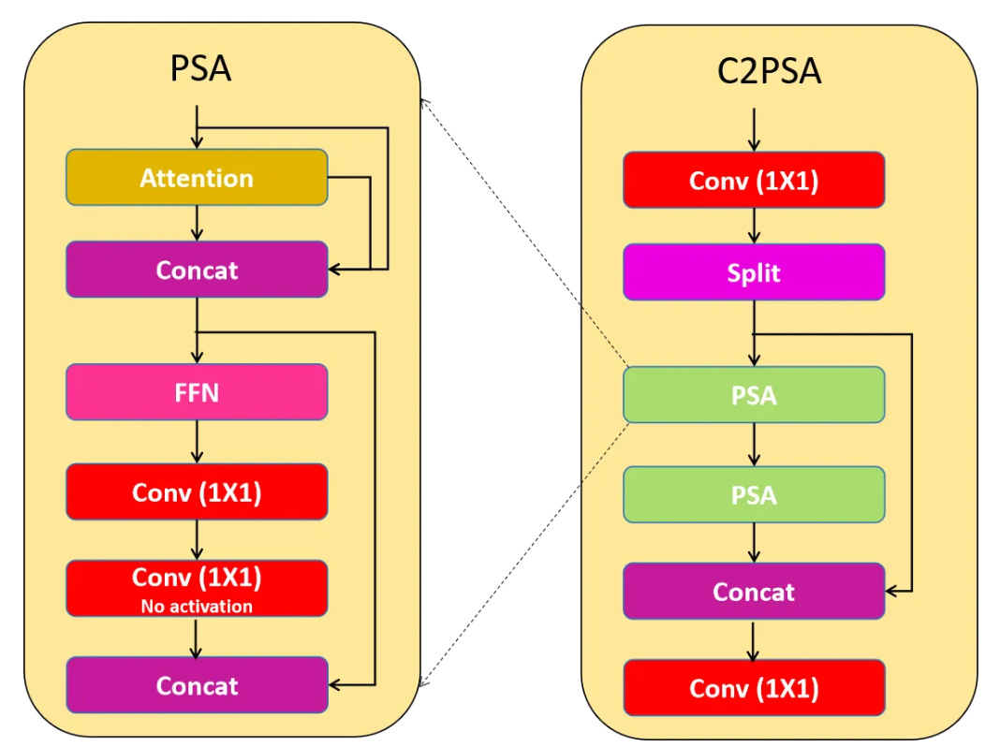

 4. Head:
 - Detection and Multi-Scale Predictions

# Training Ultralytics YOLOv11 Object Detection on Google Colab

This notebook shows how to train Ultralytics YOLOv11 Object Detector using a custom dataset.

This is done using the Google Colab infrastructure, which provides us some key features like:

- ability to run processes on GPU, essential to be able to train computer vision models.

- storage in Google Drive, where our data will be stored, both the dataset and the checkpoint of the trained model.



# 1. Installing Ultralytics



In [1]:
# Install ultralytics package.
!pip install -qq ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.5/983.5 kB 40.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 100.3 MB/s eta 0:00:00


In [4]:
# Check that the package has been installed
import ultralytics

print(ultralytics.__version__)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
8.3.115


In [5]:
# When the package gets installed we can run the yolo cli command.
# the yolo settings shows us how is the package configured, and some
# important directories paths, like:
# - datasets_dir: where the datasets are expected to be stored, and
# - runs_dir: where the processes are going to store its results
#             (like the resulting training files)

!yolo settings

JSONDict("/root/.config/Ultralytics/settings.json"):
{
  "settings_version": "0.0.6",
  "datasets_dir": "/content/datasets",
  "weights_dir": "weights",
  "runs_dir": "runs",
  "uuid": "569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb",
  "sync": true,
  "api_key": "",
  "openai_api_key": "",
  "clearml": true,
  "comet": true,
  "dvc": true,
  "hub": true,
  "mlflow": true,
  "neptune": true,
  "raytune": true,
  "tensorboard": false,
  "wandb": false,
  "vscode_msg": true
}
💡 Learn more about Ultralytics Settings at https://docs.ultralytics.com/quickstart/#ultralytics-settings


# 2. Preparing the dataset

In [8]:
# First of all, let's mount Google Drive.
# When running this cell, a pop up will appear asking
# you to grant access to your Google Drive drive.

# This way the training process will be able to store the progress
# into your google drive.

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [21]:

# TODO:
# Create a folder into your Google Drive.
# This folder will be the working directory.
# Then point the DRIVE_WORKING_DIR variable to the path of this directory.

# In my case is:
DRIVE_WORKING_DIR = "/content/drive/MyDrive/Traffic-signs.v3i.yolov11.zip"
print(DRIVE_WORKING_DIR)

/content/drive/MyDrive/Traffic-signs.v3i.yolov11.zip


In [22]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Custom dataset

I've created a Traffic signal dataset, as a subset of the MS COCO dataset, exporting only images.

Or you can use your own dataset, the procedure is exactly the same, as long as it is formatted for YOLO.


In [23]:
# I've uploaded the zipped dataset file cats_dogs.zip into my Google Drive folder:
!ls -lh *.zip

ls: cannot access '*.zip': No such file or directory


In [24]:
# decompress the zip to the hard drive instance

# NOTE:
# for training it is faster to place the files into the Colab instance
# hard drive, avoiding network latencies.

!unzip -o -qq /content/drive/MyDrive/Traffic-signs.v3i.yolov11.zip -d /content/datasets

In [25]:
# dataset files should be on /content/datasets:

!ls /content/datasets

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [26]:
# This script prints the dataset structure in a tree-like format.

import os

def count_files(dir_path, extensions):
    return sum(1 for f in os.listdir(dir_path) if os.path.isfile(os.path.join(dir_path, f)) and os.path.splitext(f)[1].lower() in extensions)


def count_image_files(dir_path):
    # Define common image extensions
    image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.gif'}
    return count_files(dir_path, image_extensions)

def count_label_files(dir_path):
    # Define common label extensions
    label_extensions = {'.txt', '.xml'}
    return count_files(dir_path, label_extensions)

def print_dataset_structure(root_dir, indent="", is_last=True):
    """
      Prints the dataset structure in a tree-like format.

      Inputs:
        root_dir: str (path where a dataset is placed)


    """
    # Print the root directory
    if indent == "":
        print(root_dir)

    # Get sorted directory contents
    items = sorted(os.listdir(root_dir))
    items_count = len(items)

    for i, item in enumerate(items):
        item_path = os.path.join(root_dir, item)
        is_item_last = (i == items_count - 1)  # Check if the item is the last one

        # Determine prefix
        prefix = "└── " if is_item_last else "├── "
        next_indent = indent + ("    " if is_item_last else "│   ")

        if item == ".DS_Store":
            pass

        elif os.path.isdir(item_path):
            # Print directory name
            print(f"{indent}{prefix}{item}")
            # Recurse into subdirectory
            subdirs = sorted(os.listdir(item_path))
            for j, sub in enumerate(subdirs):
                sub_path = os.path.join(item_path, sub)
                if os.path.isdir(sub_path):
                    img_count = count_image_files(sub_path)
                    lbl_count = count_label_files(sub_path)
                    sub_prefix = "└── " if j == len(subdirs) - 1 else "├── "
                    found = []
                    if img_count > 0:
                        found.append(f"{img_count} images")
                    if lbl_count > 0:
                        found.append(f"{lbl_count} labels")
                    if len(found) == 0:
                      count = ""
                    else:
                      count = "[" + ", ".join(found) + "]"
                    print(f"{next_indent}{sub_prefix}{sub} {count}")
        else:
            print(f"{indent}{prefix}{item}")


In [28]:
print_dataset_structure("/content/datasets")

/content/datasets
├── README.dataset.txt
├── README.roboflow.txt
├── data.yaml
├── test
│   ├── images [162 images]
│   └── labels [162 labels]
├── train
│   ├── images [931 images]
│   └── labels [931 labels]
└── valid
    ├── images [335 images]
    └── labels [335 labels]


In [30]:
# The data.yaml file, defines some dataset parameters, such as
# split file paths, and classnames:

!cat /content/datasets/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 139
names: ['Airplanes', 'Barrier Ahead', 'Beginning_of_center_divider', 'Bicycles', 'Both_ways', 'Bridge', 'Curve_to_right', 'Curving_left', 'Cycle Crossing', 'Danger', 'Double_curve_left', 'Double_curve_right', 'Downward_slope', 'Drive_both_sides', 'Drive_to_the_right', 'End_of_center_divider_side', 'Falling_rocks', 'Four-way_intersection', 'Give Way', 'Habitual_congestion_section', 'Horn Prohibited', 'Hospital', 'Indication_Bicycle_crossing', 'Indication_Bicycle_parking_area', 'Indication_Bicycles_only', 'Indication_Bicycles_only_with_lane', 'Indication_Bus_only_lane', 'Indication_Bypass', 'Indication_Children_Protection', 'Indication_Drive_both_the_right', 'Indication_Drive_on_the_left', 'Indication_Drive_on_the_right', 'Indication_Elders_Protection', 'Indication_Go_straight_or_left_turn', 'Indication_Go_straight_or_right_turn', 'Indication_HOV_Lane', 'Indication_Left_or_right_turn', 'Indication_Left_turn_and_U-t

## Visualizing Some Examples

When we work with a dataset it is always convenient to visualize some examples to see what they look like.

It is also advisable to check if the labels are correct and are in the format we expect.

The following functions allow us to plot some images and their corresponding labels:

In [31]:
import cv2
from matplotlib.patches import Rectangle
from matplotlib import pyplot as plt
import numpy as np
from glob import glob
import os



In [35]:
class_names = ['Airplanes', 'Barrier Ahead', 'Beginning_of_center_divider', 'Bicycles', 'Both_ways', 'Bridge',
'Curve_to_right', 'Curving_left', 'Cycle Crossing', 'Danger', 'Double_curve_left', 'Double_curve_right',
'Downward_slope', 'Drive_both_sides', 'Drive_to_the_right', 'End_of_center_divider_side', 'Falling_rocks',
'Four-way_intersection', 'Give Way', 'Habitual_congestion_section', 'Horn Prohibited', 'Hospital',
'Indication_Bicycle_crossing', 'Indication_Bicycle_parking_area', 'Indication_Bicycles_only',
'Indication_Bicycles_only_with_lane', 'Indication_Bus_only_lane', 'Indication_Bypass',
'Indication_Children_Protection', 'Indication_Drive_both_the_right', 'Indication_Drive_on_the_left',
'Indication_Drive_on_the_right', 'Indication_Elders_Protection', 'Indication_Go_straight_or_left_turn',
'Indication_Go_straight_or_right_turn', 'Indication_HOV_Lane', 'Indication_Left_or_right_turn',
'Indication_Left_turn_and_U-turn', 'Indication_Make_left_turn', 'Indication_Make_right_turn',
'Indication_One_way_left', 'Indication_One_way_right', 'Indication_One_way_straight', 'Indication_Parking_area',
'Indication_Pedestrian_crossing', 'Indication_Pedestrian_only', 'Indication_Priority', 'Indication_Proceeding_direction',
'Indication_Roundabout_straight', 'Indication_Safety_area', 'Indication_Safety_for_children',
'Indication_Unprotected_left_turn', 'Indication_Use_the_snow_tire_chain', 'Indication_Vehicles_only',
'Indication_for_bicycles_and_pedestrians', 'Indication_for_bicycles_and_pedestrians_separation',
'Indication_u-turn_ways', 'Left Hair Pin Bend', 'Left hand curve', 'Left_lane_is_merged', 'Men at Work', 'Merge_left',
'Merge_right', 'Narrow_road_ahead', 'No Parking', 'No Stopping', 'Parking Lot Cars', 'Parking Lot Cycle',
'Pedestrian Crossing', 'Pedestrian Prohibited', 'Pedestrian_crossing', 'Petrol Pump- Gas Station', 'Prionity',
'Railroad_crossing', 'Right Hair Pin Bend', 'Right Hand Curve', 'Right Reverse Bend', 'Right_lane_is_merged',
'Riverside_drive', 'Road Wideness Ahead', 'Road_construction', 'Rough_road_condition', 'Roundabout',
'Safety_for_children', 'Safety_for_wild_animals', 'School Ahead', 'Slippery_road', 'Speed Limit -10-',
'Speed Limit -100-', 'Speed Limit -35-', 'Speed Limit -60-', 'Speed Limit -80-', 'Speed limit -40-',
'Speed_bump_ahead', 'Stop', 'Straight Prohibitor No Entry', 'T-shaped_intersection', 'Traffic_signal',
'Tree-way_intersection_left', 'Tree-way_intersection_right', 'Tunnel', 'Upward_slope', 'Wet_road_condition', 'Wind',
'Y-shaped_intersection', 'indication_protection_of_the_disabled', 'indication_protection_of_the_elderly',
'regulatory_Distance_between_the_vehicles', 'regulatory_Drive_slowly', 'regulatory_Maximum_Speed_limit',
'regulatory_Minimum_speed_limit', 'regulatory_No_bicycles_allowed', 'regulatory_No_buses_allowed',
'regulatory_No_carts_allowed', 'regulatory_No_carts_allowed-push_cars_allowed', 'regulatory_No_crossing',
'regulatory_No_entrance', 'regulatory_No_left_turn', 'regulatory_No_parking', 'regulatory_No_passage',
'regulatory_No_passing', 'regulatory_No_pedestrian_crossing', 'regulatory_No_pedestrian_walking',
'regulatory_No_push_cars_allowed', 'regulatory_No_right_turn', 'regulatory_No_stop_or_parking',
'regulatory_No_straight_drive', 'regulatory_No_tractors-Cultivator', 'regulatory_No_trucks_allowed',
'regulatory_No_two-wheelers-prime_movers-bicycles_allowed', 'regulatory_No_u-turn',
'regulatory_No_vehicles-two-wheelers-prime_movers-bicycles_allowed', 'regulatory_No_vehicles_allowed',
'regulatory_No_vehicles_with_hazardous_object', 'regulatory_Stop', 'regulatory_Vehicle_height_limit',
'regulatory_Vehicle_weight_limit', 'regulatory_Vehicle_width_limit', 'regulatory_Yield']

In [45]:
def read_labels(file_name):
  with open(file_name, "r") as f:
    lines = f.read().splitlines()

  labels = []
  for line in lines:
    label = [float(n) for n in line.split(" ")]
    label = int(label[0]), label[1:]
    labels.append(label)
  return labels


def plot(rgb, labels, class_names=class_names):
  plt.figure(figsize=(18, 8))
  plt.imshow(rgb)

  img_w, img_h = rgb.shape[1], rgb.shape[0]
  ax = plt.gca()
  for label in labels:
    class_id, bbox = label
    cx, cy, w, h = bbox

    cx *= img_w
    cy *= img_h
    w *= img_w
    h *= img_h

    hw, hh = w / 2, h / 2
    pt = (cx - hw, cy - hh)
    color = 'blue' if class_id == 0 else 'red'

    ax.add_patch(Rectangle(pt, w, h, edgecolor=color, fill=None))

    label_text = class_names[int(class_id)]
    label_position = (cx - hw, cy - hh - 5)
    ax.text(label_position[0], label_position[1],
            label_text, color=color, fontsize=12, fontweight='bold',
            bbox=dict(facecolor='white', edgecolor=color, alpha=0.7))
  plt.show()

In [46]:
def sample_some(data_root, split="valid", n=10, seed=1234):
  np.random.seed(seed)
  label_path = os.path.join(data_root, f"{split}/labels/*.txt")
  label_files = sorted(glob.glob(label_path))

  lbl_files = np.random.choice(label_files, n, replace=False).tolist()
  img_files = [f.replace("labels", "images").replace(".txt", ".jpg") for f in lbl_files]

  return img_files, lbl_files


# Usage
img_files, lbl_files = sample_some(
    data_root="/content/datasets",
    split="valid",
    n=3,
    seed=42
)

In [47]:
img_files

['/content/datasets/valid/images/BA-49-_png.rf.34567f59cbfc2a7ef39a3b9546ae0632.jpg',
 '/content/datasets/valid/images/GIVEWAY-98-_jpg.rf.249ab3015dece8b6af8a770725acbf79.jpg',
 '/content/datasets/valid/images/GIVEWAY-24-_jpg.rf.ec6c2c2416fbe4336261d29500082ec7.jpg']

In [48]:
lbl_files

['/content/datasets/valid/labels/BA-49-_png.rf.34567f59cbfc2a7ef39a3b9546ae0632.txt',
 '/content/datasets/valid/labels/GIVEWAY-98-_jpg.rf.249ab3015dece8b6af8a770725acbf79.txt',
 '/content/datasets/valid/labels/GIVEWAY-24-_jpg.rf.ec6c2c2416fbe4336261d29500082ec7.txt']

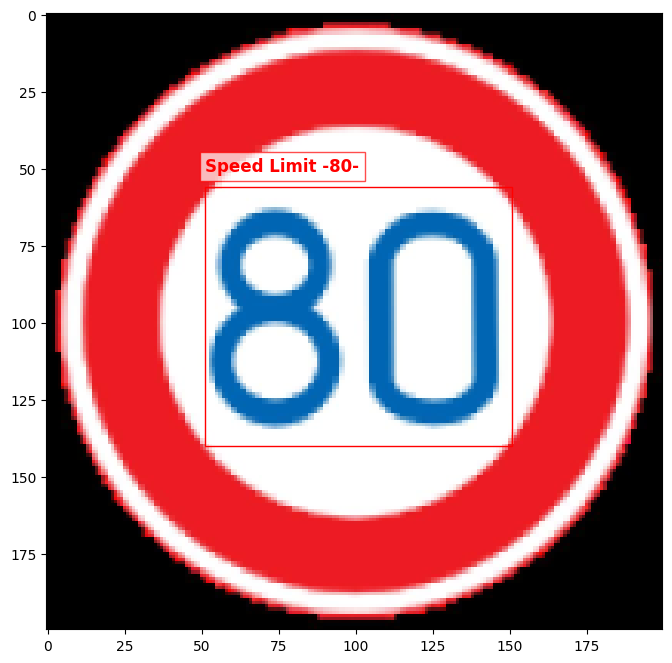

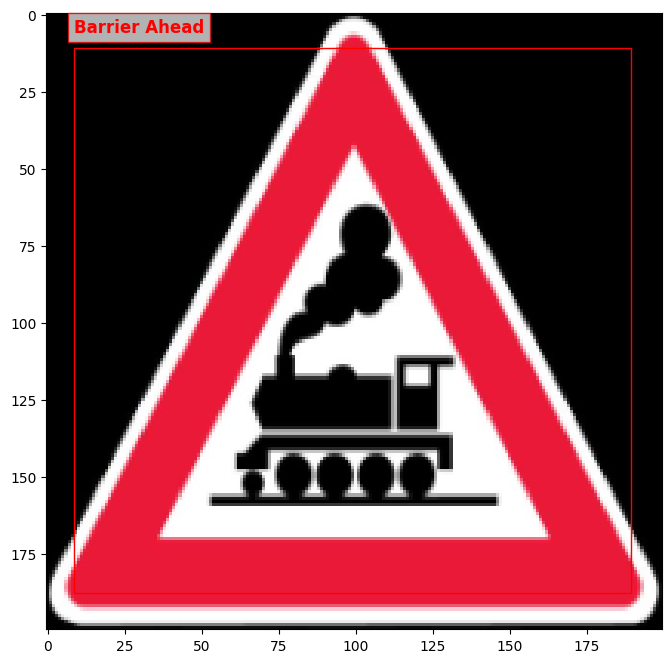

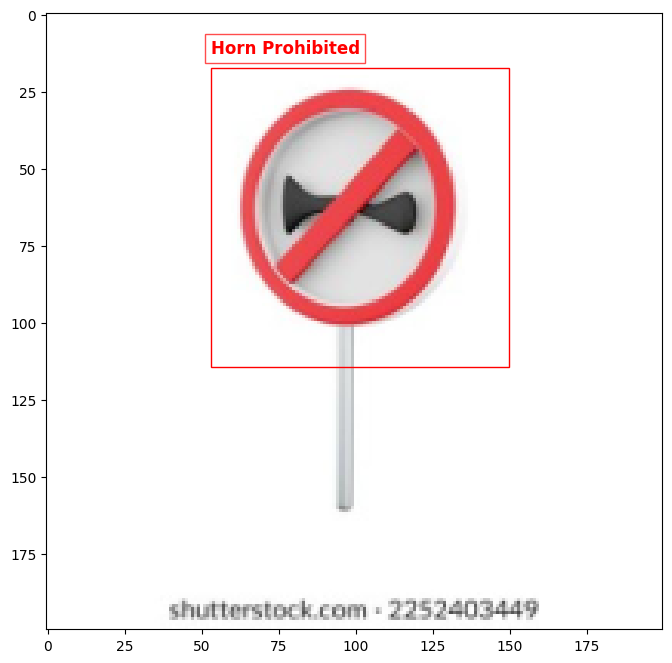

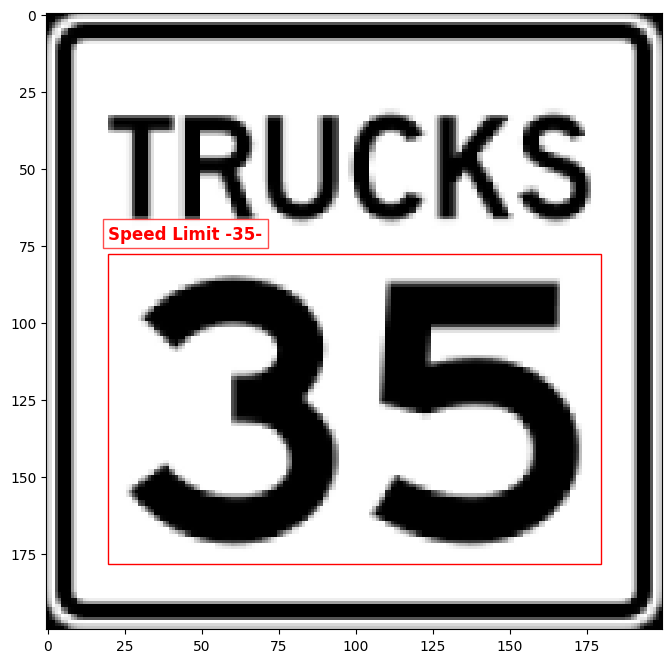

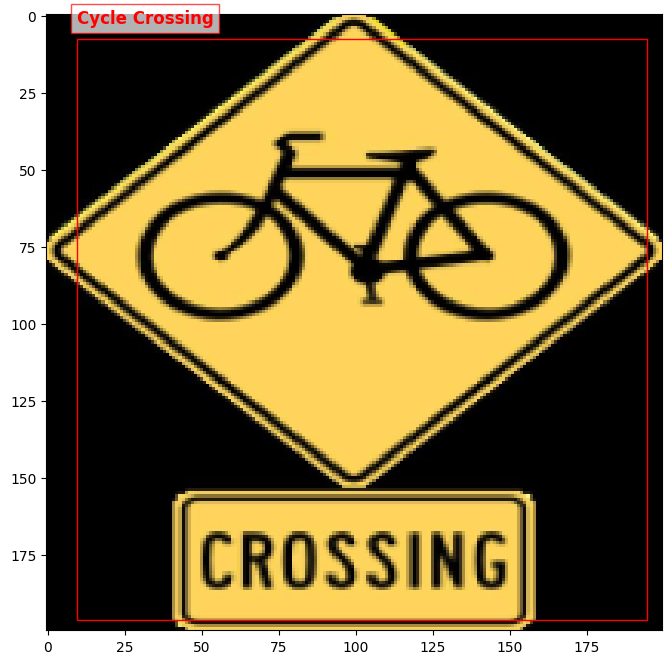

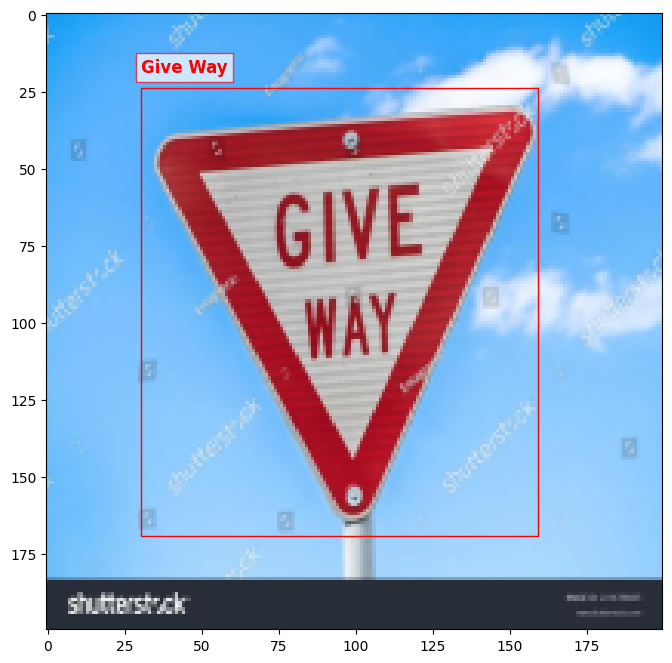

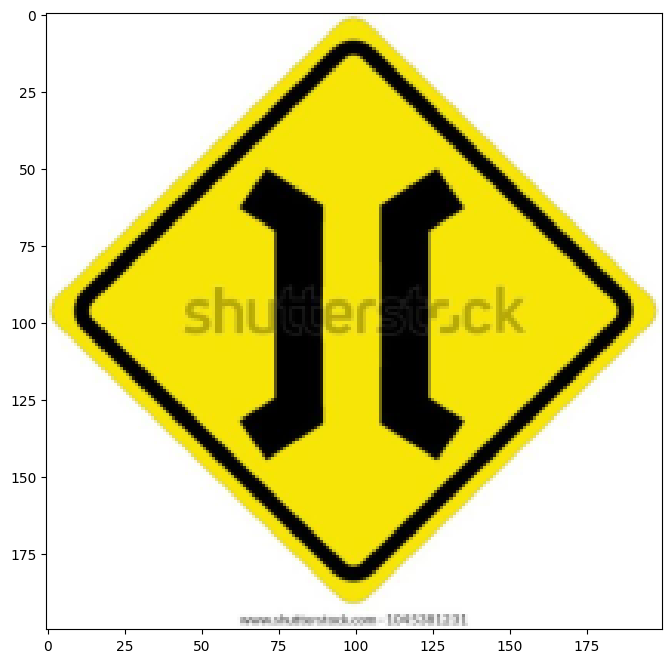

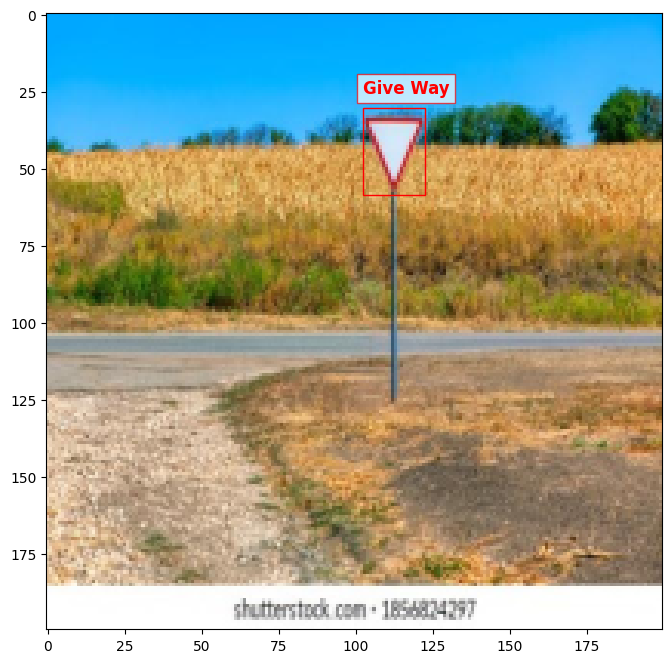

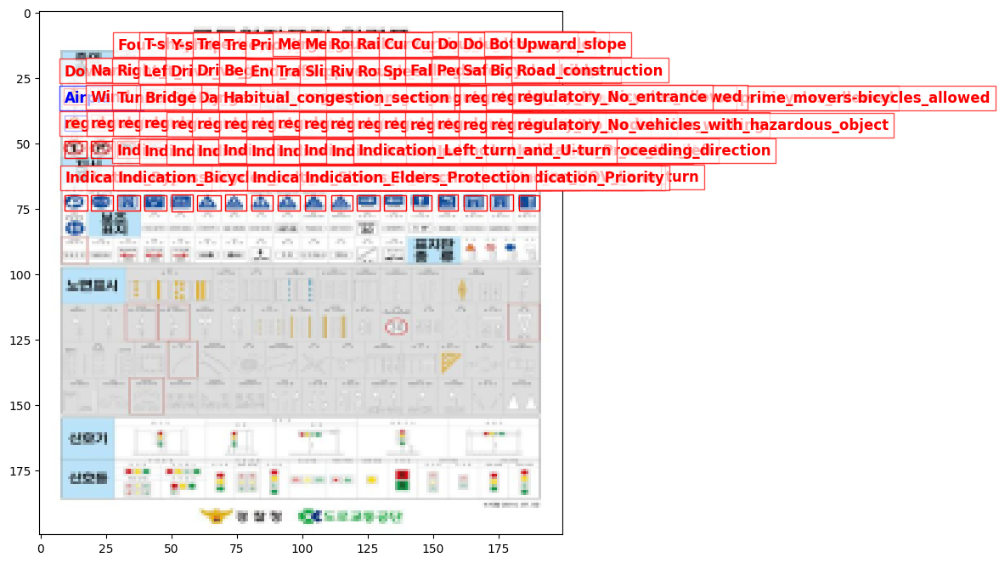

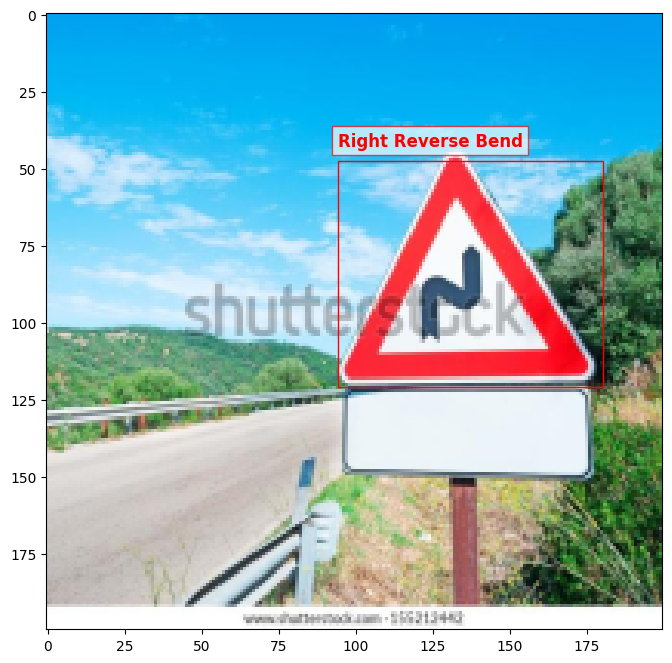

In [50]:
# choose some random files
data_root = "/content/datasets"
samples = sample_some(data_root)

for image_file, label_file in zip(*samples):
    image = cv2.imread(image_file)

    # Resize image to a fixed width while maintaining aspect ratio
    target_width = 200
    h, w = image.shape[:2]
    aspect_ratio = h / w
    new_height = int(target_width * aspect_ratio)
    resized_image = cv2.resize(image, (target_width, new_height), interpolation=cv2.INTER_AREA)

    rgb = cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB)
    labels = read_labels(label_file)

    plot(rgb, labels)


# 3. Training the model

Training the model requires intensive computation provided by GPUs. Theoretically we can train on CPU but it would take a long time. Therefore it is important to have a GPU to train. However, for data preparation and evaluation of results we can use CPU which is much less expensive. Therefore, the recommendation is to use GPU only during training.

In [51]:
import torch

cuda_available = torch.cuda.is_available()

if cuda_available:

  print("CUDA is available")
  !nvidia-smi

else:

  message = """
    WARNING: In order to train the model, it is advisable to use GPU.
    Change runtime type to GPU from:
      menu Runtime -> Change runtime type -> Hardware accelerator -> GPU.
      And run all the cells again.
  """
  print(message)

CUDA is available
Thu Apr 24 15:30:36 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P8             10W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------

In [52]:
!pwd

/content


In [53]:
def serialized_model_file(
    checkpoint="best",
    use_run="train",
):
  """
    Returns the serialized file path.
  """
  return f"runs/detect/{use_run}/weights/{checkpoint}.pt"


In [57]:
import os
import torch
from ultralytics import YOLO

def serialized_model_file(name="last", run_name="train"):
    """
    Constructs the path to a serialized model file from a run name.
    """
    return os.path.join("runs", "detect", run_name, f"{name}.pt")

def train(
    data="/content/datasets/data.yaml",
    use_run="train",
    fallback="yolo11n.pt",
    epochs=26,
    augment=True,
):
    """
    Trains a YOLO model using the Ultralytics framework.

    Parameters:
    - data (str): Path to the data.yaml file.
    - use_run (str): Name of the run folder to look for previous training.
    - fallback (str): Path to fallback model weights if no checkpoint exists.
    - epochs (int): Number of training epochs.
    - augment (bool): Whether to use data augmentation during training.
    """
    if not torch.cuda.is_available():
        print("CUDA is not available, skipping training.")
        return

    model_file = serialized_model_file("last", use_run)

    if os.path.exists(model_file):
        print(f"Resuming training from: {model_file}")
        resume_training = True
        use_model = model_file
    else:
        print(f"No previous model found. Starting fresh with: {fallback}")
        resume_training = False
        use_model = fallback

    model = YOLO(use_model)

    model.train(
        data=data,
        resume=resume_training,
        epochs=epochs,
        optimizer="AdamW",
        lr0=0.0001,
        imgsz=640,
        batch=32,
        augment=augment
    )

In [58]:
train(data="/content/datasets/data.yaml", use_run="train") # Changed use_run from None to "train"

No previous model found. Starting fresh with: yolo11n.pt
Ultralytics 8.3.115 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/datasets/data.yaml, epochs=26, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, sho

train: Scanning /content/datasets/train/labels.cache... 931 images, 17 backgrounds, 0 corrupt: 100%|██████████| 931/931 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 421.2±135.2 MB/s, size: 37.3 KB)


val: Scanning /content/datasets/valid/labels.cache... 335 images, 7 backgrounds, 0 corrupt: 100%|██████████| 335/335 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 26 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/26      5.88G       1.29      4.859      1.731          1        640: 100%|██████████| 30/30 [00:18<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.61it/s]

                   all        335        474   7.99e-05     0.0359   0.000749   0.000279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/26      5.73G      1.056      3.968      1.516          7        640: 100%|██████████| 30/30 [00:16<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.09it/s]


                   all        335        474    0.00119     0.0827    0.00444    0.00219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/26       5.7G      1.028       3.74      1.489          8        640: 100%|██████████| 30/30 [00:16<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.39it/s]

                   all        335        474    0.00509      0.126     0.0297     0.0186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/26      5.47G      1.004      3.542      1.446          8        640: 100%|██████████| 30/30 [00:16<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.63it/s]


                   all        335        474      0.219     0.0207     0.0362     0.0228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/26      5.47G     0.9579      3.535       1.42          9        640: 100%|██████████| 30/30 [00:16<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.17it/s]


                   all        335        474      0.344     0.0271     0.0328     0.0197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/26      5.72G      0.943      3.439      1.411         18        640: 100%|██████████| 30/30 [00:17<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.60it/s]


                   all        335        474      0.503     0.0444      0.041     0.0263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/26      5.75G     0.9463      3.397      1.391         12        640: 100%|██████████| 30/30 [00:16<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]


                   all        335        474      0.552     0.0576     0.0534     0.0342

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/26      5.75G     0.9486      3.276      1.391          6        640: 100%|██████████| 30/30 [00:16<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.46it/s]


                   all        335        474       0.57     0.0537     0.0546     0.0346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/26      5.47G     0.9361      3.244      1.408          4        640: 100%|██████████| 30/30 [00:16<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.25it/s]


                   all        335        474      0.618     0.0726     0.0752     0.0485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/26      5.75G     0.9377      3.036       1.39          7        640: 100%|██████████| 30/30 [00:16<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.66it/s]


                   all        335        474      0.694       0.07     0.0764     0.0487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/26      5.75G       0.92      2.995      1.379          9        640: 100%|██████████| 30/30 [00:15<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]


                   all        335        474      0.627      0.093     0.0882     0.0571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/26      5.75G     0.8928      2.975      1.355          6        640: 100%|██████████| 30/30 [00:15<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.72it/s]


                   all        335        474      0.621     0.0921     0.0991     0.0658

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/26      5.47G     0.9228      2.971      1.366          9        640: 100%|██████████| 30/30 [00:16<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.58it/s]


                   all        335        474      0.614      0.101      0.101     0.0684

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/26      5.47G     0.9217      2.772      1.378          5        640: 100%|██████████| 30/30 [00:16<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.68it/s]


                   all        335        474      0.609     0.0996      0.112     0.0724

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/26      5.75G     0.9331      2.848      1.376          8        640: 100%|██████████| 30/30 [00:16<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.68it/s]


                   all        335        474       0.67        0.1      0.111     0.0756

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/26      5.75G     0.9001      2.732      1.361          6        640: 100%|██████████| 30/30 [00:16<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.44it/s]


                   all        335        474      0.649      0.118      0.116     0.0805
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/26      5.75G      0.937      3.072      1.573          3        640: 100%|██████████| 30/30 [00:17<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.60it/s]


                   all        335        474      0.562      0.148      0.119     0.0754

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/26      5.71G      0.854      2.945      1.502          3        640: 100%|██████████| 30/30 [00:16<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]


                   all        335        474      0.564      0.125      0.113     0.0778

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/26      5.71G     0.8237      2.835      1.452          3        640: 100%|██████████| 30/30 [00:15<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.67it/s]


                   all        335        474      0.605      0.134      0.117     0.0796

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/26      5.44G     0.8536      2.759       1.49          3        640: 100%|██████████| 30/30 [00:16<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.62it/s]


                   all        335        474      0.619      0.127       0.12     0.0839

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/26      5.71G     0.8176       2.72      1.427          3        640: 100%|██████████| 30/30 [00:16<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.91it/s]


                   all        335        474      0.629      0.141      0.137     0.0925

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/26      5.43G     0.8354        2.7      1.435          3        640: 100%|██████████| 30/30 [00:15<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.36it/s]


                   all        335        474      0.621      0.157       0.14     0.0958

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/26      5.57G     0.7996      2.636      1.405          3        640: 100%|██████████| 30/30 [00:15<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.82it/s]


                   all        335        474       0.61      0.158      0.146     0.0998

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/26      5.71G     0.8069      2.615      1.423          3        640: 100%|██████████| 30/30 [00:15<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:05<00:00,  1.20it/s]


                   all        335        474       0.64      0.148      0.147      0.102

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/26      5.71G     0.7773      2.618      1.399          4        640: 100%|██████████| 30/30 [00:15<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:04<00:00,  1.43it/s]


                   all        335        474      0.598      0.154      0.149      0.104

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/26      5.71G      0.791      2.528      1.406          3        640: 100%|██████████| 30/30 [00:16<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.65it/s]


                   all        335        474      0.562      0.159       0.15      0.104

26 epochs completed in 0.157 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.6MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.6MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.115 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,659,405 parameters, 0 gradients, 6.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:14<00:00,  2.45s/it]


                   all        335        474      0.496      0.159      0.145        0.1
             Airplanes          2          2          1          0          0          0
         Barrier Ahead         29         29      0.684      0.931      0.945      0.805
Beginning_of_center_divider          2          2          0          0          0          0
              Bicycles          2          2          1          0          0          0
             Both_ways          2          2          1          0          0          0
                Bridge          1          1          0          0          0          0
        Curve_to_right          2          2          1          0          0          0
          Curving_left          2          2          1          0          0          0
        Cycle Crossing         25         25      0.669      0.728      0.732      0.522
                Danger          2          2          0          0          0          0
     Double_curv

In [59]:
!yolo settings

JSONDict("/root/.config/Ultralytics/settings.json"):
{
  "settings_version": "0.0.6",
  "datasets_dir": "/content/datasets",
  "weights_dir": "weights",
  "runs_dir": "runs",
  "uuid": "569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb",
  "sync": true,
  "api_key": "",
  "openai_api_key": "",
  "clearml": true,
  "comet": true,
  "dvc": true,
  "hub": true,
  "mlflow": true,
  "neptune": true,
  "raytune": true,
  "tensorboard": false,
  "wandb": false,
  "vscode_msg": true
}
💡 Learn more about Ultralytics Settings at https://docs.ultralytics.com/quickstart/#ultralytics-settings


# 4. Reviewing Training Results

After training we will find some resulting files into the runs directory:

## checking results into the "runs" directory

Ultralytics package creates the "runs" directory, where the results are stored. Since we are training an object detector, the detect/train directory is created:

If we train again with different configurations, new directories train2, train3, train4… will be created, unless we resume training. If we resume training, the corresponding directories are re-used.

In [60]:
!ls -l runs/detect/train

total 1348
-rw-r--r-- 1 root root   1508 Apr 24 15:32 args.yaml
-rw-r--r-- 1 root root 192002 Apr 24 15:33 labels_correlogram.jpg
-rw-r--r-- 1 root root 263736 Apr 24 15:33 labels.jpg
-rw-r--r-- 1 root root    769 Apr 24 15:33 results.csv
-rw-r--r-- 1 root root 300641 Apr 24 15:33 train_batch0.jpg
-rw-r--r-- 1 root root 279947 Apr 24 15:33 train_batch1.jpg
-rw-r--r-- 1 root root 322974 Apr 24 15:33 train_batch2.jpg
drwxr-xr-x 2 root root   4096 Apr 24 15:33 weights


### Training history

we can observe, a sharp worsening jump in the loss curves, and after that the model starts improving. One possible explanation is as follows: My dataset is a sub-set of COCO, the pre-trained weights at start were created  using the same images, so the model already knew how to detect cats and dogs. Surely I started with a very high learning rate, destroying the previous learned knowledge? Should I start with a much lower learning rate? or perhaps should I freeze the first layers, to avoid this effect and achieve much faster convergence?

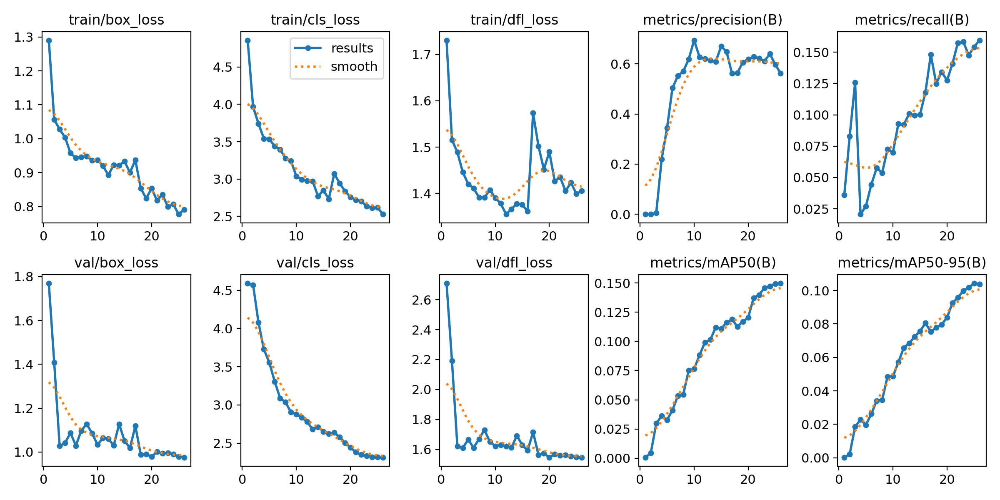

In [62]:

from PIL import Image
Image.open("/content/runs/detect/train2/results.png")

### args.yaml

Into the `args.yaml` file we can check the running arguments, like total number of epochs, enabled augmentations, etc.

Check its contents to see which parameters were used for this experiment.

In [63]:
!cat runs/detect/train/args.yaml

task: detect
mode: train
model: yolo11n.pt
data: /content/datasets/data.yaml
epochs: 20
time: null
patience: 100
batch: 64
imgsz: 320
save: true
save_period: -1
cache: false
device: null
workers: 8
project: null
name: train
exist_ok: false
pretrained: true
optimizer: AdamW
verbose: true
seed: 0
deterministic: true
single_cls: false
rect: false
cos_lr: false
close_mosaic: 10
resume: false
amp: true
fraction: 1.0
profile: false
freeze: null
multi_scale: false
overlap_mask: true
mask_ratio: 4
dropout: 0.0
val: true
split: val
save_json: false
conf: null
iou: 0.7
max_det: 300
half: false
dnn: false
plots: true
source: null
vid_stride: 1
stream_buffer: false
visualize: false
augment: true
agnostic_nms: false
classes: null
retina_masks: false
embed: null
show: false
save_frames: false
save_txt: false
save_conf: false
save_crop: false
show_labels: true
show_conf: true
show_boxes: true
line_width: null
format: torchscript
keras: false
optimize: false
int8: false
dynamic: false
simplify: true
o

### checkpoint files

On the weights directory we can find the PyTorch serialized checkpoints files:
- best.pt
- last.pt

These files contain the model weights as well as the training state, so that we can continue training from these serialized files. Use last.pt for continue training, and best.pt for production.

In [64]:
!ls -lh runs/detect/train/weights

total 32M
-rw-r--r-- 1 root root 16M Apr 24 15:33 best.pt
-rw-r--r-- 1 root root 16M Apr 24 15:33 last.pt


### Batch visualizations

The files like `train_batch#.jpg` and `val_batch_pred#.jpg` are grids of batch images and its corresponding bounding boxes:

#### Training Visualization
here is a training batch visualization.
Note the applied augmentation transformations like mosaic, flip, and intensities shifts.

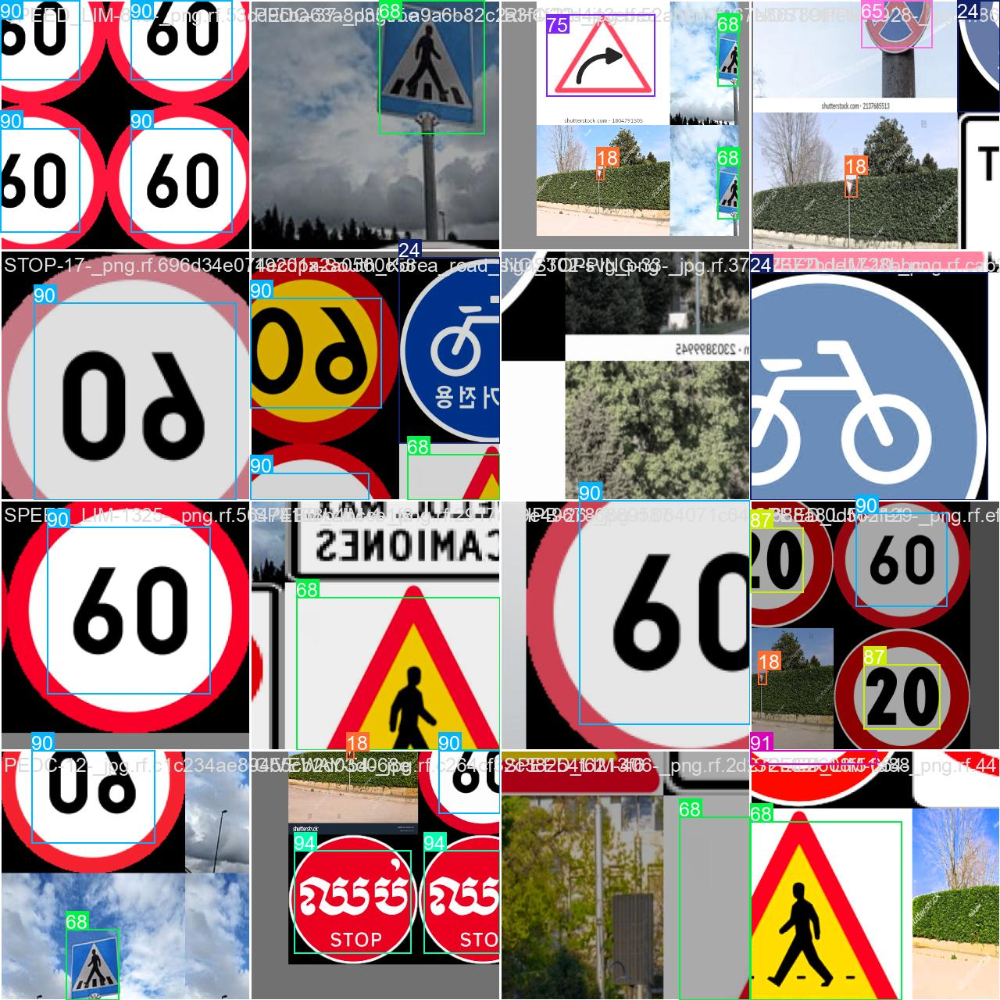

In [65]:

Image.open("/content/runs/detect/train/train_batch0.jpg")


#### Validation Visualization
here is a validation batch visualization. We can see the predicted bounding boxes, each one with its corresponding class and prediction confidence.

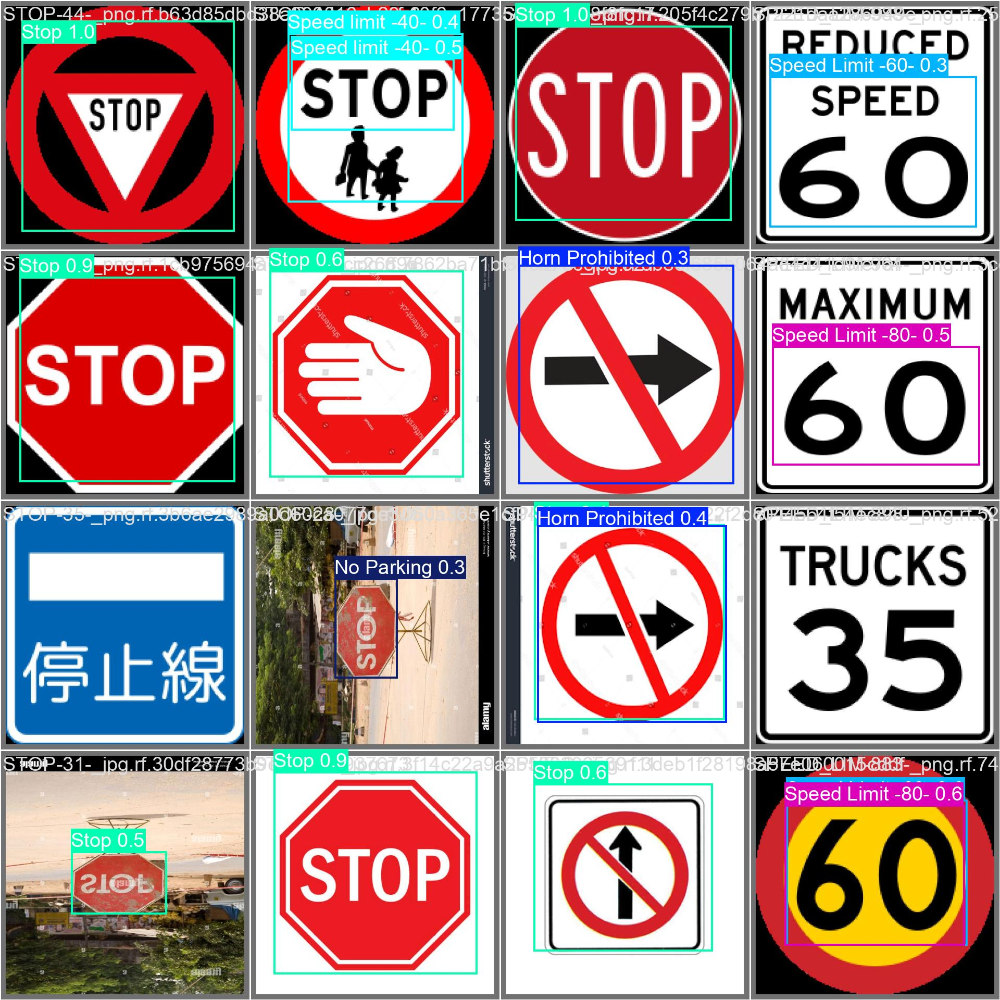

In [66]:
Image.open("/content/runs/detect/train2/val_batch0_pred.jpg")

### PR_curve.png

Precision-Recall plot which helps us evaluate the object detector by showing the trade-off between precision and recall across different thresholds.

By analyzing the PR curve, we can choose confidence thresholds that align with the specific goals of your application, such as prioritizing precision (e.g., for safety-critical tasks) or recall (e.g., for exhaustive search tasks).


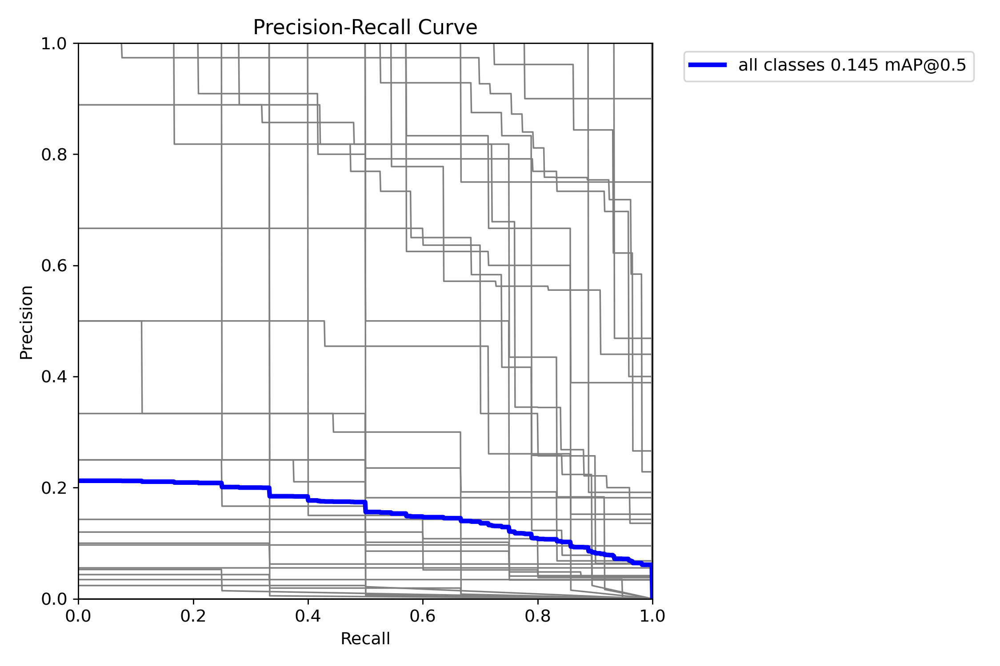

In [67]:
Image.open("/content/runs/detect/train2/PR_curve.png")

### confusion_matrix.png

A confusion matrix in object detection is useful for analyzing how well the model distinguishes between object classes (e.g., cat vs. dog) and background, highlighting misclassifications and false positives/negatives at a glance.

By analyzing the confusion matrix, you can pinpoint which classes are most problematic, evaluate the balance between precision and recall, and identify areas where the model might need improvement, such as adjusting thresholds, augmenting the dataset, or fine-tuning the training process.

In this case, with a simple glance we see that the weakest point of the model is its False Negatives, that is, cases where the model claims that there are cats or dogs, but according to the labels, they are not really there.

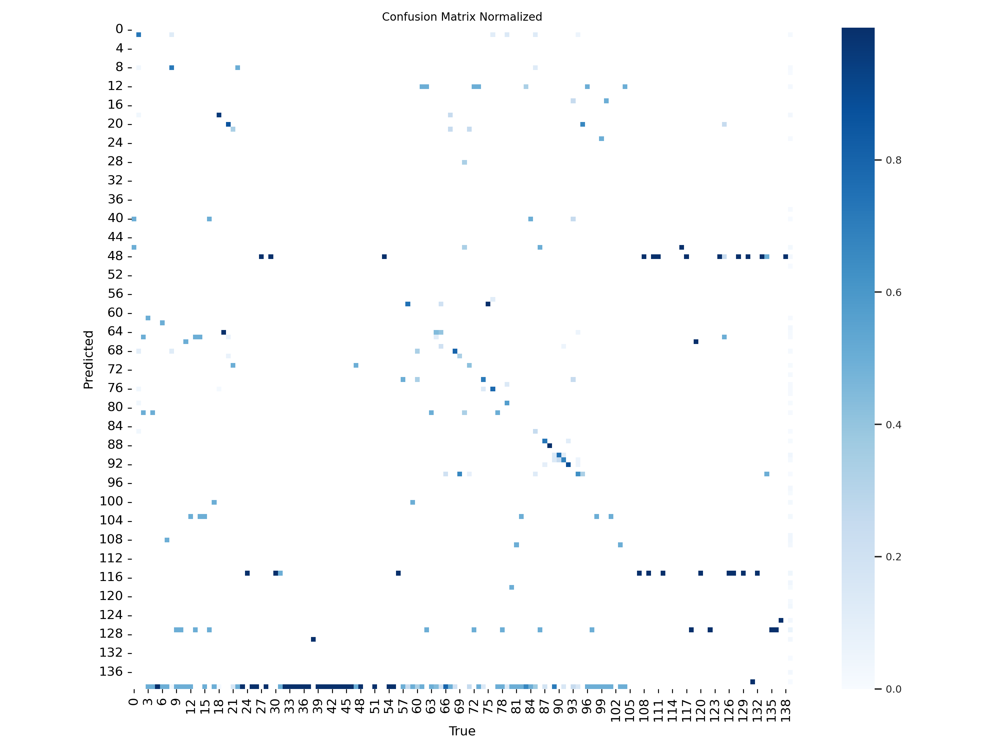

In [69]:
Image.open("/content/runs/detect/train2/confusion_matrix_normalized.png")

## Testing the model

In [70]:
!pwd

/content


### Predicting via cli


In [71]:
!yolo detect predict model=runs/detect/train/weights/best.pt source=/content/datasets/valid/images/1920px-South_Korea_road_sign_314-svg_png.rf.cf43523f84f73648d02258a4fdb4a3ed.jpg

Ultralytics 8.3.115 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,659,405 parameters, 0 gradients, 6.7 GFLOPs

image 1/1 /content/datasets/valid/images/1920px-South_Korea_road_sign_314-svg_png.rf.cf43523f84f73648d02258a4fdb4a3ed.jpg: 320x320 (no detections), 22.1ms
Speed: 1.4ms preprocess, 22.1ms inference, 28.3ms postprocess per image at shape (1, 3, 320, 320)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


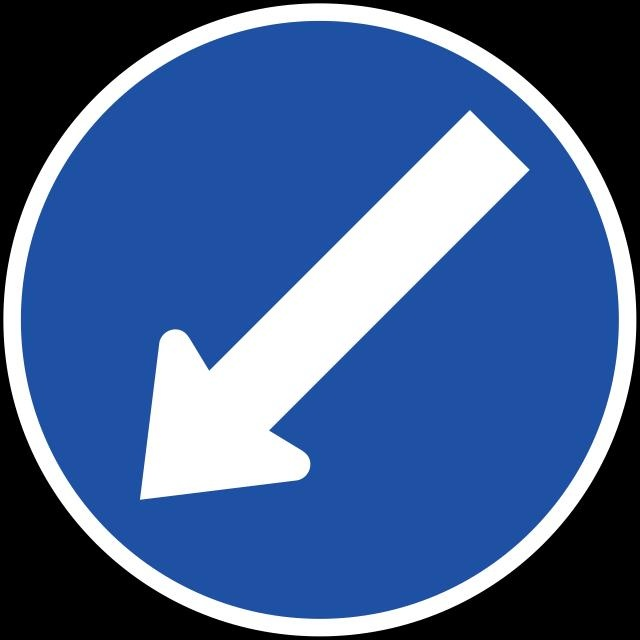

In [72]:
from PIL import Image
Image.open("/content/runs/detect/predict/1920px-South_Korea_road_sign_314-svg_png.rf.cf43523f84f73648d02258a4fdb4a3ed.jpg")

### Predicting using Python

#### Load the best.pt model

In [74]:
from ultralytics import YOLO

# Load the best model we have so far:
model_file = "runs/detect/train/weights/best.pt"
print(f"loading checkpoint {model_file}")
model = YOLO(model_file)


loading checkpoint runs/detect/train/weights/best.pt


#### Ploting the results using matlab

Ultralytics provide tools for plotting the results, but in a real-world application we'll want to use the prediction results programmatically.

The following code reads prediction results, its bounding boxes and plots them using matplotlib.


In [75]:
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle

def convert_to_pixel_coords(box, img_width, img_height):
    """
    Convert YOLO format box (cx, cy, w, h) to pixel coordinates.
    """
    return [
        box[0] * img_width,  # cx
        box[1] * img_height, # cy
        box[2] * img_width,  # w
        box[3] * img_height  # h
    ]

def calculate_iou(box1, box2):
    """
    Calculate Intersection over Union (IoU) for two bounding boxes.
    Boxes are in the format (cx, cy, w, h).
    """
    # Convert (cx, cy, w, h) to (x1, y1, x2, y2)
    x1_box1, y1_box1 = box1[0] - box1[2] / 2, box1[1] - box1[3] / 2
    x2_box1, y2_box1 = box1[0] + box1[2] / 2, box1[1] + box1[3] / 2

    x1_box2, y1_box2 = box2[0] - box2[2] / 2, box2[1] - box2[3] / 2
    x2_box2, y2_box2 = box2[0] + box2[2] / 2, box2[1] + box2[3] / 2

    # Calculate intersection
    inter_x1 = max(x1_box1, x1_box2)
    inter_y1 = max(y1_box1, y1_box2)
    inter_x2 = min(x2_box1, x2_box2)
    inter_y2 = min(y2_box1, y2_box2)

    inter_area = max(0, inter_x2 - inter_x1) * max(0, inter_y2 - inter_y1)

    # Calculate union
    box1_area = (x2_box1 - x1_box1) * (y2_box1 - y1_box1)
    box2_area = (x2_box2 - x1_box2) * (y2_box2 - y1_box2)

    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area if union_area > 0 else 0

def plot_result(rgb, result, label=None, iou_threshold=0.5):
    """
    Plot YOLO prediction results and compare with ground truth labels if provided.

    Parameters:
      - rgb: numpy array of the RGB image.
      - result: YOLO prediction result.
      - label: Optional ground truth labels [(class_id, [cx, cy, w, h]), ...].
      - iou_threshold: IoU threshold to match predictions with ground truth.
    """
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(rgb)

    class_names = result.names
    height, width, _ = rgb.shape

    predictions = result.boxes.xywh.cpu().numpy()
    pred_classes = result.boxes.cls.cpu().numpy()

    gt_used = [False] * len(label) if label else []

    for i, pred_box in enumerate(predictions):
        pred_class_id = int(pred_classes[i])
        pred_box = pred_box.tolist()
        matched = False

        if label:
            for j, (gt_class_id, gt_box) in enumerate(label):
                if not gt_used[j] and gt_class_id == pred_class_id:
                    # Convert ground truth box to pixel values
                    gt_box_pixel = convert_to_pixel_coords(gt_box, width, height)
                    iou = calculate_iou(pred_box, gt_box_pixel)
                    if iou >= iou_threshold:
                        matched = True
                        gt_used[j] = True
                        break

        color = 'green' if matched else 'red'
        cx, cy, w, h = pred_box
        hw, hh = w / 2, h / 2

        ax.add_patch(Rectangle(
            (cx - hw, cy - hh), w, h,
            edgecolor=color,
            fill=None,
            linewidth=2
        ))

        label_text = f"{class_names[pred_class_id]} ({iou:.2f})" if matched else class_names[pred_class_id]
        ax.text(
            cx - hw, cy - hh - 5,
            label_text,
            color=color,
            fontsize=10,
            fontweight='bold',
            bbox=dict(facecolor='white', edgecolor=color, alpha=0.7)
        )

    if label:
        for gt_class_id, gt_box in label:
            # Convert ground truth box to pixel values
            gt_box_pixel = convert_to_pixel_coords(gt_box, width, height)
            cx, cy, w, h = gt_box_pixel
            hw, hh = w / 2, h / 2

            ax.add_patch(Rectangle(
                (cx - hw, cy - hh), w, h,
                edgecolor='blue',
                fill=None,
                linestyle='--',
                linewidth=1
            ))

    plt.show()



0: 320x320 (no detections), 14.5ms
Speed: 2.2ms preprocess, 14.5ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


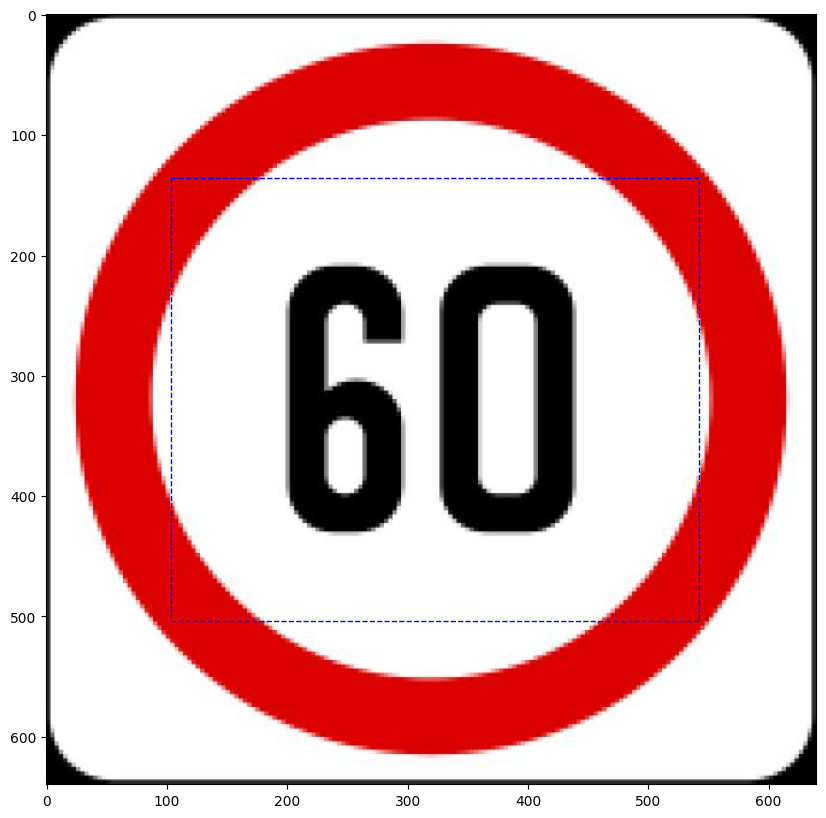


0: 320x320 (no detections), 14.3ms
Speed: 1.5ms preprocess, 14.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


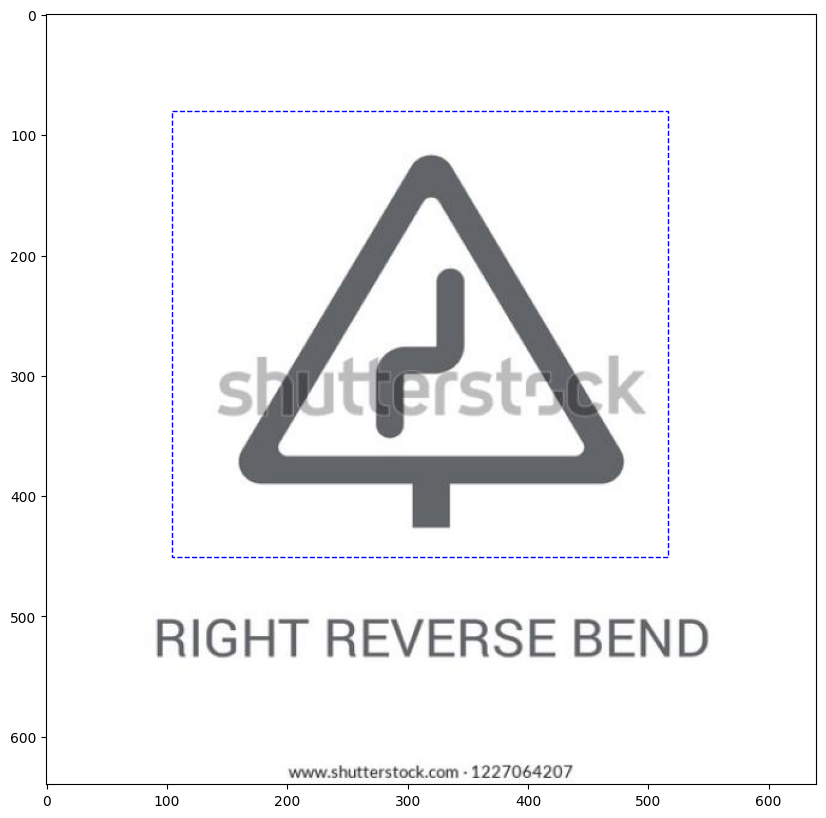


0: 320x320 (no detections), 17.3ms
Speed: 1.5ms preprocess, 17.3ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


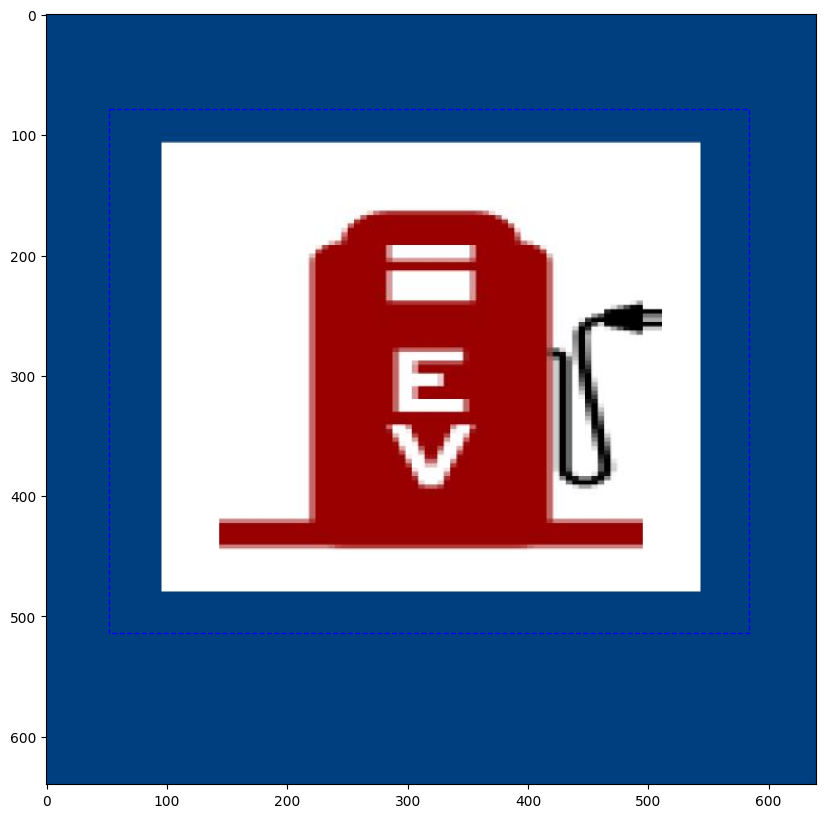


0: 320x320 (no detections), 14.7ms
Speed: 1.4ms preprocess, 14.7ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


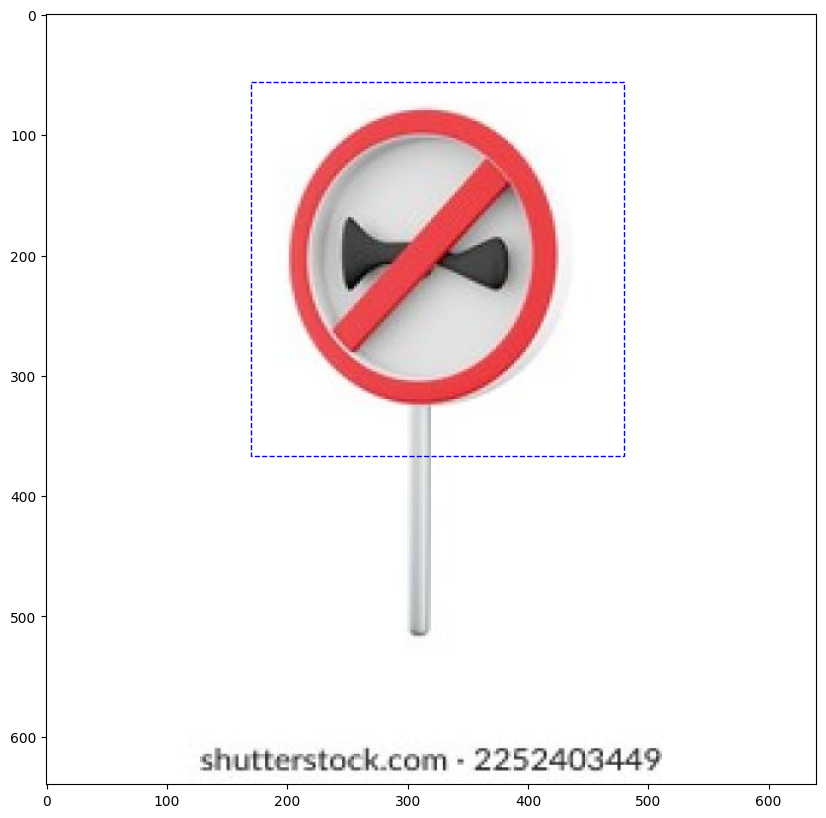


0: 320x320 (no detections), 15.7ms
Speed: 1.6ms preprocess, 15.7ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


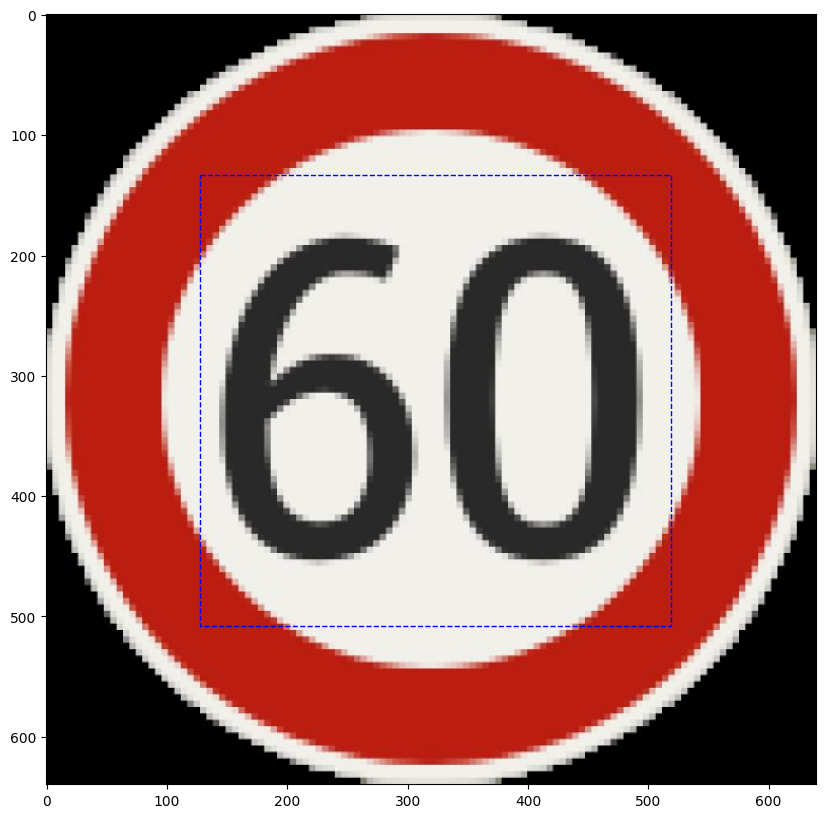


0: 320x320 (no detections), 16.7ms
Speed: 1.5ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


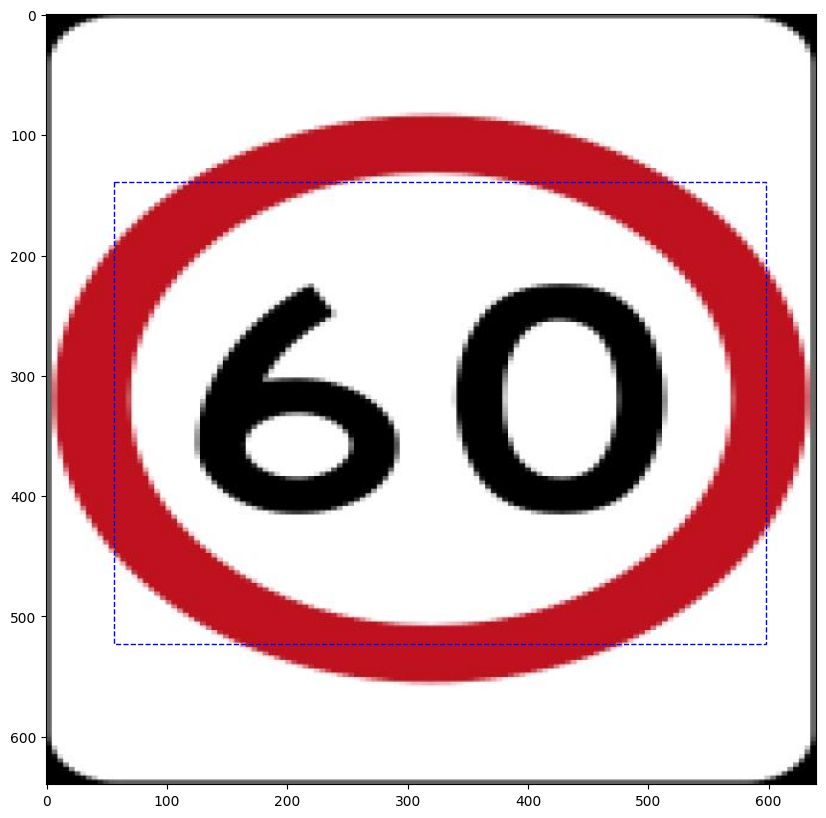


0: 320x320 (no detections), 17.0ms
Speed: 1.4ms preprocess, 17.0ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


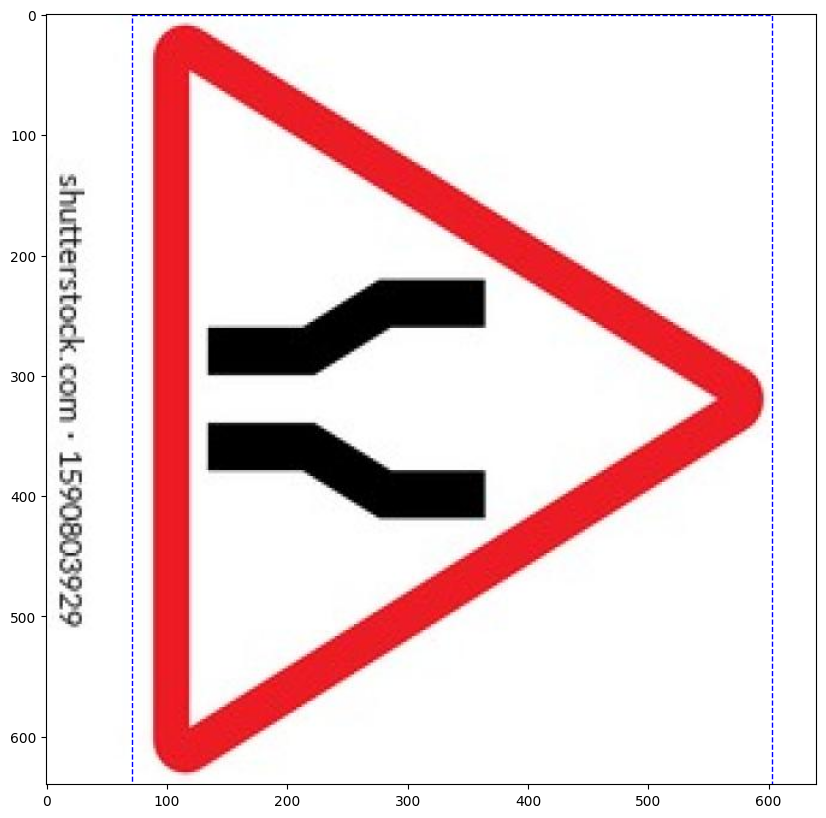


0: 320x320 (no detections), 17.7ms
Speed: 1.3ms preprocess, 17.7ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


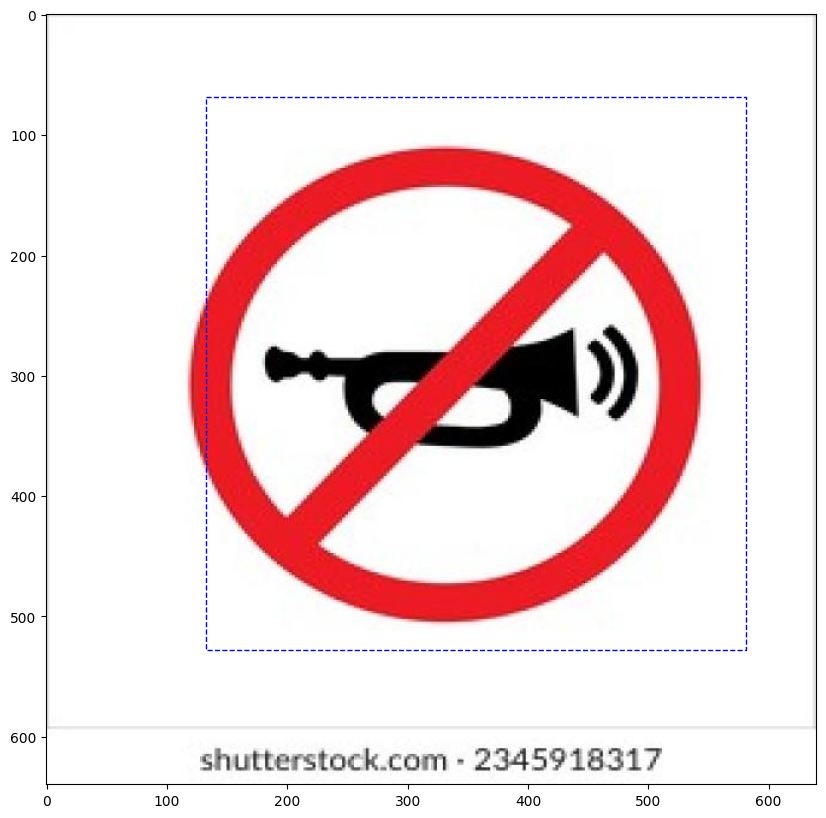

In [80]:
import os
import random
import cv2
from ultralytics import YOLO

# Load model (adjust path as necessary)
model = YOLO('/content/runs/detect/train/weights/best.pt')  # or another trained model path

def read_labels(label_path):
    """
    Read YOLO format labels: class cx cy w h
    """
    with open(label_path, 'r') as f:
        lines = f.read().strip().split('\n')
        labels = []
        for line in lines:
            parts = list(map(float, line.split()))
            class_id = int(parts[0])
            box = parts[1:]
            labels.append((class_id, box))
    return labels

def sample_some(data_root, split="", seed=42, n=8):
    """
    Randomly sample n image-label pairs from the dataset.
    """
    random.seed(seed)
    # The original path might be incorrect. Check if the val directory is present
    # within images and labels directories under the datasets directory.
    # If not, adjust the path accordingly.
    # If the val directory is present directly under datasets, use this path:
    image_dir = os.path.join(data_root, split, "images")
    label_dir = os.path.join(data_root, split, "labels")

    image_files = [f for f in os.listdir(image_dir) if f.endswith(".jpg") or f.endswith(".png")]
    sample_files = random.sample(image_files, n)

    image_paths = [os.path.join(image_dir, f) for f in sample_files]
    label_paths = [os.path.join(label_dir, f.replace(".jpg", ".txt").replace(".png", ".txt")) for f in sample_files]

    return list(zip(image_paths, label_paths))

# Sample from dataset
samples = sample_some("/content/datasets/valid", n=8)

# Plot results
for image_path, label_path in samples:
    image = cv2.imread(image_path)
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    labels = read_labels(label_path)

    result = model(rgb)[0]  # run inference and get first result
    plot_result(rgb, result, labels)


0: 320x320 (no detections), 16.0ms
Speed: 2.8ms preprocess, 16.0ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


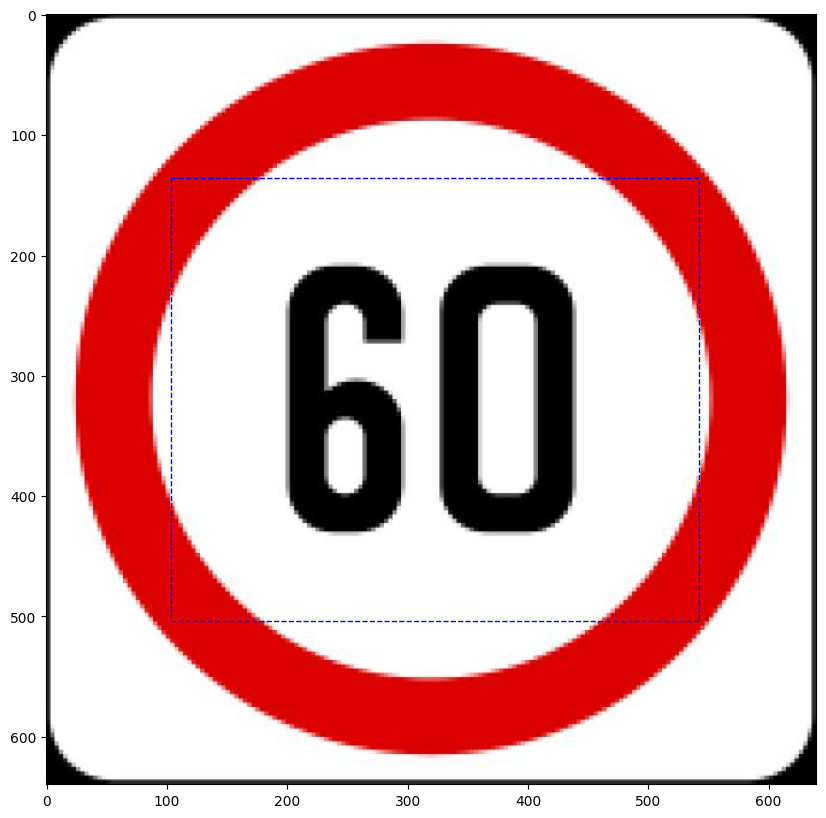


0: 320x320 (no detections), 18.6ms
Speed: 1.5ms preprocess, 18.6ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 320)


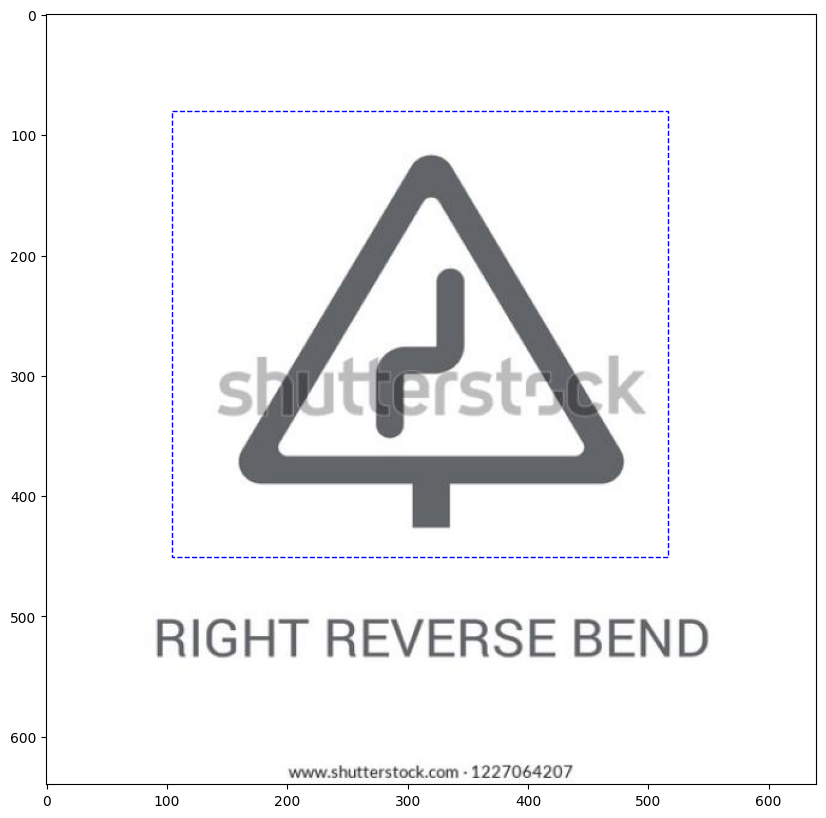


0: 320x320 (no detections), 14.5ms
Speed: 1.6ms preprocess, 14.5ms inference, 1.3ms postprocess per image at shape (1, 3, 320, 320)


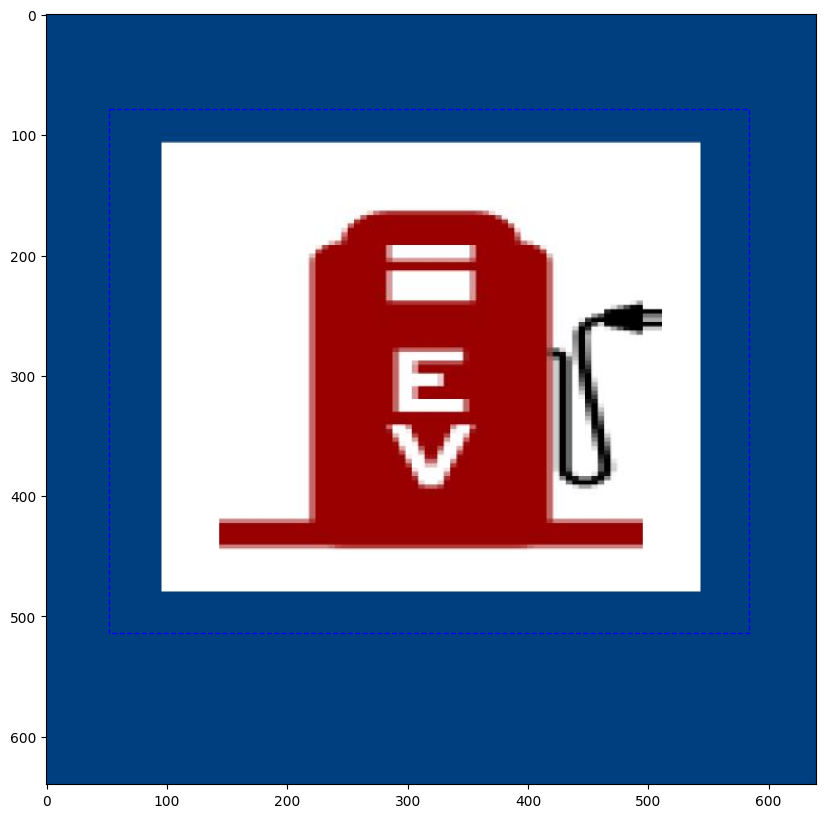


0: 320x320 (no detections), 14.6ms
Speed: 1.3ms preprocess, 14.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 320)


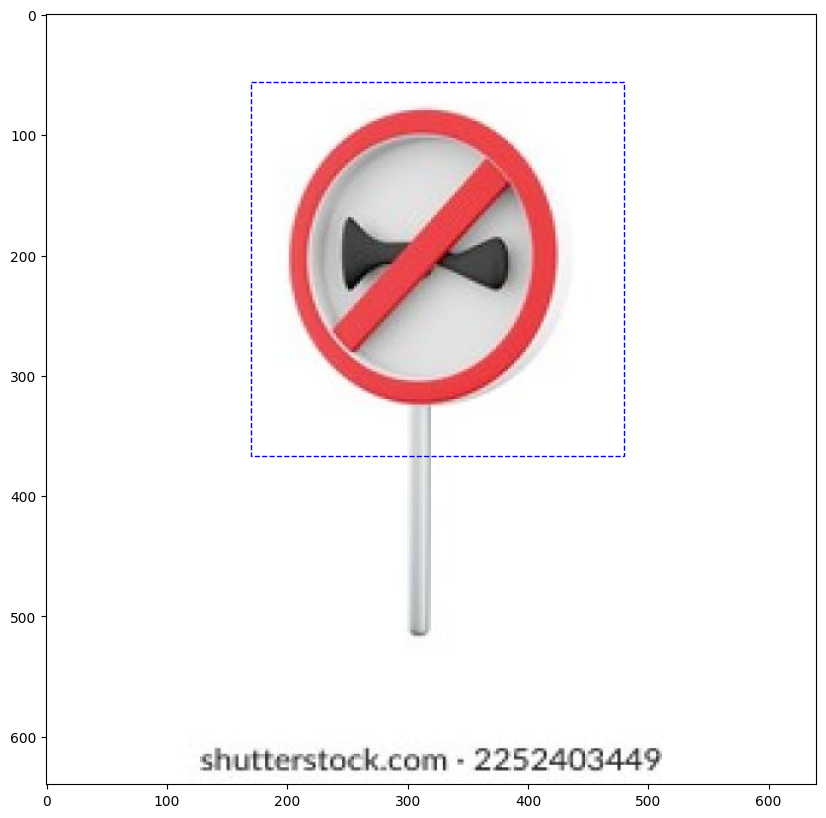


0: 320x320 (no detections), 18.8ms
Speed: 1.6ms preprocess, 18.8ms inference, 5.5ms postprocess per image at shape (1, 3, 320, 320)


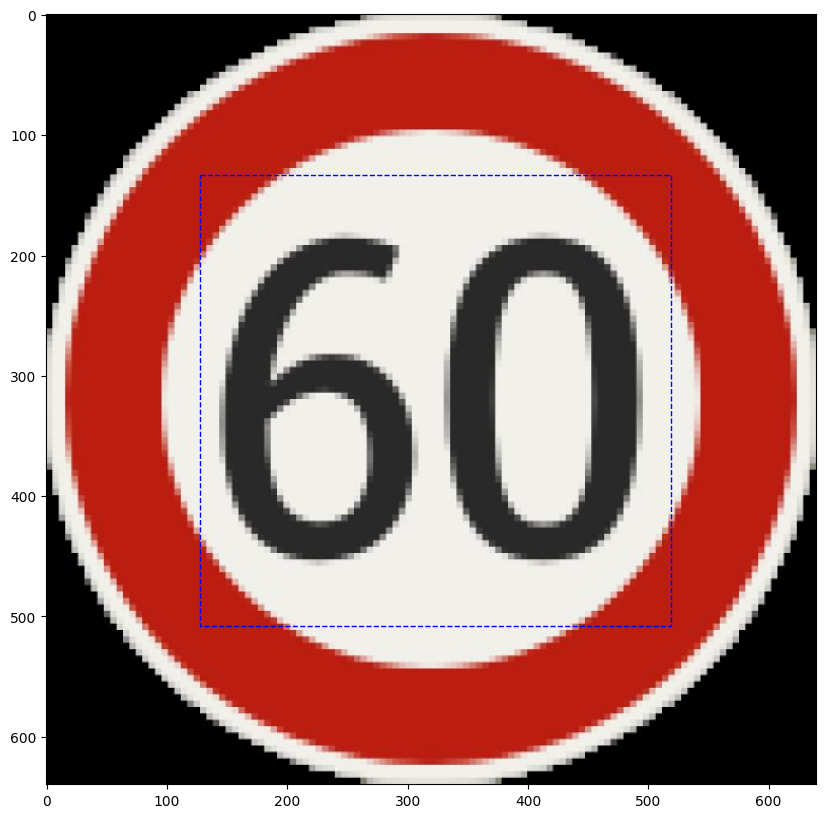


0: 320x320 (no detections), 18.7ms
Speed: 1.5ms preprocess, 18.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 320)


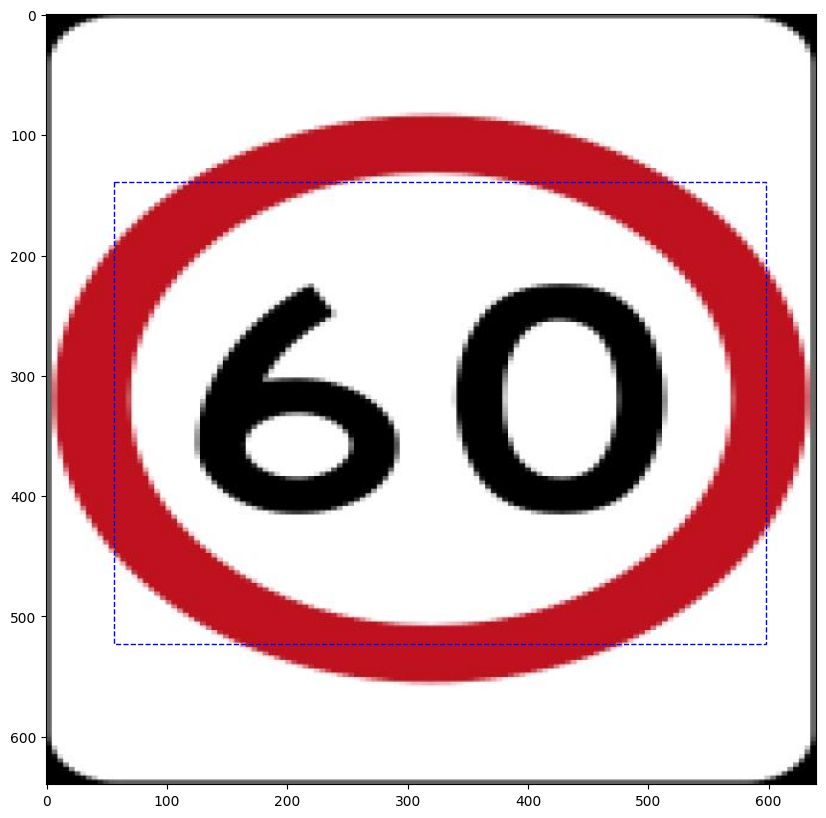


0: 320x320 (no detections), 15.6ms
Speed: 1.5ms preprocess, 15.6ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


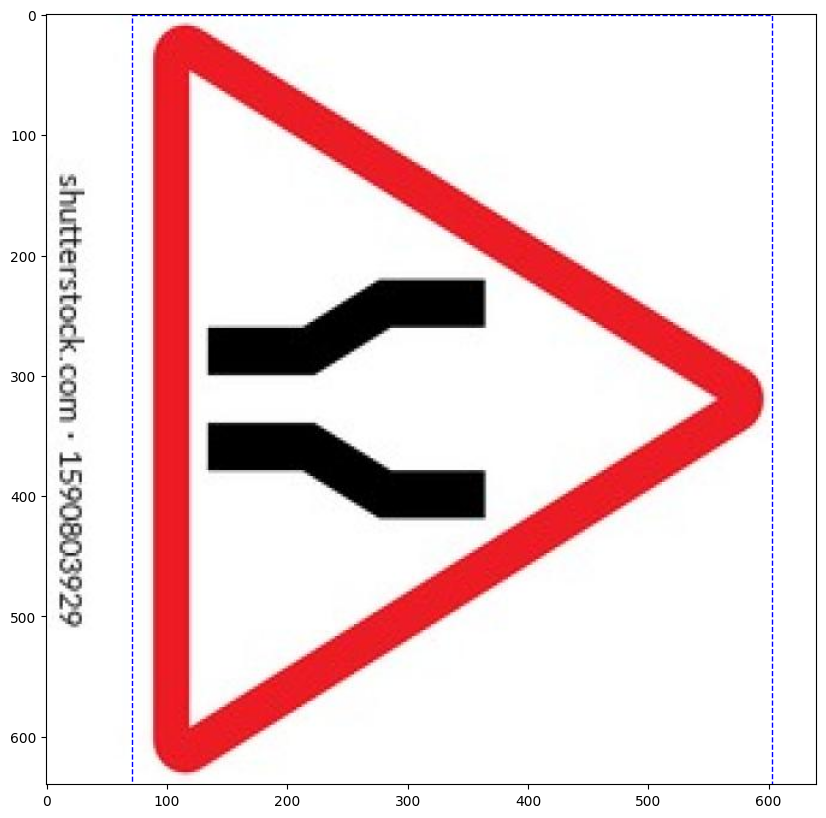


0: 320x320 (no detections), 14.3ms
Speed: 1.4ms preprocess, 14.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 320)


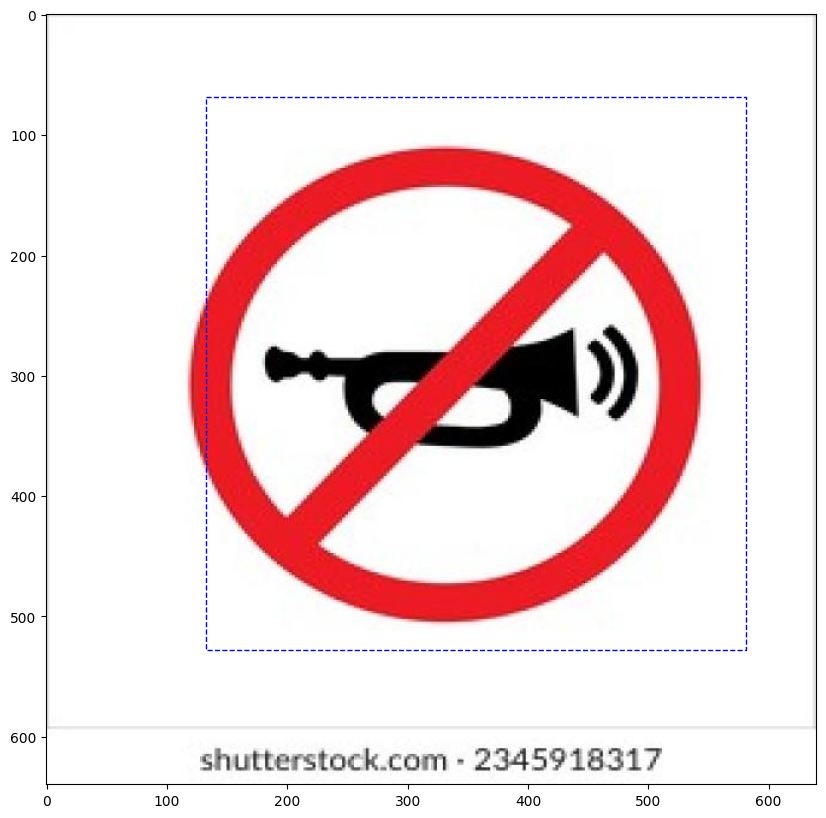

In [82]:
for image_file, labels_file in samples:

    img = cv2.imread(image_file)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    labels = read_labels(labels_file)
    result = model.predict(rgb, conf=0.5, iou=0.3)[0]

    plot_result(rgb, result, labels)